In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S6_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

[I 2025-05-27 02:10:15,873] A new study created in memory with name: no-name-679cca3f-07aa-47be-97f5-642344350590
[I 2025-05-27 02:12:08,616] Trial 0 finished with value: 0.06276433318853378 and parameters: {'lr': 0.002526254727548935, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.43254658871529406}. Best is trial 0 with value: 0.06276433318853378.


Cross Validation Accuracies:
[0.05336854234337807, 0.06035896763205528, 0.06777120381593704, 0.06309552490711212, 0.0692274272441864]
Mean Cross Validation Accuracy:
0.06276433318853378
Standard Deviation of Cross Validation Accuracy:
0.005674798591534781


[I 2025-05-27 02:15:52,456] Trial 1 finished with value: 9.921045780181885 and parameters: {'lr': 0.11002873333516335, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4106269774179824}. Best is trial 0 with value: 0.06276433318853378.


Cross Validation Accuracies:
[10.37793254852295, 7.168029308319092, 9.85673999786377, 12.247475624084473, 9.95505142211914]
Mean Cross Validation Accuracy:
9.921045780181885
Standard Deviation of Cross Validation Accuracy:
1.6251407723244613


[I 2025-05-27 02:17:01,396] Trial 2 finished with value: 0.07308670952916145 and parameters: {'lr': 0.0063551173006432095, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4733167904295875}. Best is trial 0 with value: 0.06276433318853378.


Cross Validation Accuracies:
[0.07144131511449814, 0.05770423635840416, 0.08329503983259201, 0.08513598889112473, 0.06785696744918823]
Mean Cross Validation Accuracy:
0.07308670952916145
Standard Deviation of Cross Validation Accuracy:
0.010159460089773358


[I 2025-05-27 02:18:45,575] Trial 3 finished with value: 0.059174515306949615 and parameters: {'lr': 0.006810606391341819, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4287967577604124}. Best is trial 3 with value: 0.059174515306949615.


Cross Validation Accuracies:
[0.04964771121740341, 0.06554453819990158, 0.06656801700592041, 0.06108913570642471, 0.05302317440509796]
Mean Cross Validation Accuracy:
0.059174515306949615
Standard Deviation of Cross Validation Accuracy:
0.00674545508257063


[I 2025-05-27 02:20:25,331] Trial 4 finished with value: 0.06057940125465393 and parameters: {'lr': 0.049630274217344256, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4050162524049371}. Best is trial 3 with value: 0.059174515306949615.


Cross Validation Accuracies:
[0.05863691493868828, 0.06127673760056496, 0.06921359896659851, 0.06096954271197319, 0.05280021205544472]
Mean Cross Validation Accuracy:
0.06057940125465393
Standard Deviation of Cross Validation Accuracy:
0.0052816076368811015


[I 2025-05-27 02:27:09,119] Trial 5 finished with value: 7.555828189849853 and parameters: {'lr': 0.09418946096960465, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3800071160686028}. Best is trial 3 with value: 0.059174515306949615.


Cross Validation Accuracies:
[3.2720489501953125, 8.21282958984375, 11.494710922241211, 5.208963871002197, 9.590587615966797]
Mean Cross Validation Accuracy:
7.555828189849853
Standard Deviation of Cross Validation Accuracy:
2.9646325454083517


[I 2025-05-27 02:30:15,047] Trial 6 finished with value: 0.056848452985286714 and parameters: {'lr': 0.013611802631115397, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3972116475567523}. Best is trial 6 with value: 0.056848452985286714.


Cross Validation Accuracies:
[0.04680481180548668, 0.05308693274855614, 0.06309784203767776, 0.06191309913992882, 0.059339579194784164]
Mean Cross Validation Accuracy:
0.056848452985286714
Standard Deviation of Cross Validation Accuracy:
0.006098114079474571


[I 2025-05-27 02:32:15,952] Trial 7 finished with value: 0.05674857050180435 and parameters: {'lr': 0.0024285899431168508, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4313964330162724}. Best is trial 7 with value: 0.05674857050180435.


Cross Validation Accuracies:
[0.04098174721002579, 0.052703116089105606, 0.06997670978307724, 0.07237980514764786, 0.04770147427916527]
Mean Cross Validation Accuracy:
0.05674857050180435
Standard Deviation of Cross Validation Accuracy:
0.01237842908917976


[I 2025-05-27 02:36:17,033] Trial 8 finished with value: 0.5672958195209503 and parameters: {'lr': 0.1816664953951384, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23593169779926293}. Best is trial 7 with value: 0.05674857050180435.


Cross Validation Accuracies:
[0.3714165985584259, 0.724378228187561, 0.6073992848396301, 0.695533812046051, 0.4377511739730835]
Mean Cross Validation Accuracy:
0.5672958195209503
Standard Deviation of Cross Validation Accuracy:
0.1399132861203298


[I 2025-05-27 02:39:11,045] Trial 9 finished with value: 0.07588754892349243 and parameters: {'lr': 0.0024519951034634663, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.37461332295783256}. Best is trial 7 with value: 0.05674857050180435.


Cross Validation Accuracies:
[0.06417519599199295, 0.05420722812414169, 0.08634573221206665, 0.08139114826917648, 0.09331844002008438]
Mean Cross Validation Accuracy:
0.07588754892349243
Standard Deviation of Cross Validation Accuracy:
0.014496307730116936


[I 2025-05-27 02:41:36,122] Trial 10 finished with value: 0.06918602511286735 and parameters: {'lr': 0.6746936344414507, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.1033326307139806}. Best is trial 7 with value: 0.05674857050180435.


Cross Validation Accuracies:
[0.05627856031060219, 0.08277180790901184, 0.08142776787281036, 0.06676831096410751, 0.05868367850780487]
Mean Cross Validation Accuracy:
0.06918602511286735
Standard Deviation of Cross Validation Accuracy:
0.011110184818663708


[I 2025-05-27 02:44:23,905] Trial 11 finished with value: 0.058530917018651964 and parameters: {'lr': 0.013039379161154876, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2941594121698274}. Best is trial 7 with value: 0.05674857050180435.


Cross Validation Accuracies:
[0.04677971825003624, 0.054291095584630966, 0.06858701258897781, 0.0707620158791542, 0.05223474279046059]
Mean Cross Validation Accuracy:
0.058530917018651964
Standard Deviation of Cross Validation Accuracy:
0.009449162985773368


[I 2025-05-27 02:47:01,933] Trial 12 finished with value: 0.05376540198922157 and parameters: {'lr': 0.001170196335407645, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3185784715798768}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04094095155596733, 0.05240612104535103, 0.06308393180370331, 0.06251505762338638, 0.049880947917699814]
Mean Cross Validation Accuracy:
0.05376540198922157
Standard Deviation of Cross Validation Accuracy:
0.008304151114388314


[I 2025-05-27 02:49:38,742] Trial 13 finished with value: 0.05438077077269554 and parameters: {'lr': 0.0017118053643610243, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.30171780792751857}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04283659905195236, 0.0531620979309082, 0.06325264275074005, 0.06238333135843277, 0.05026918277144432]
Mean Cross Validation Accuracy:
0.05438077077269554
Standard Deviation of Cross Validation Accuracy:
0.0076734517451868545


[I 2025-05-27 02:52:33,080] Trial 14 finished with value: 0.05437512323260307 and parameters: {'lr': 0.001055607706518229, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2590264165030075}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.042268067598342896, 0.05309385061264038, 0.0632036104798317, 0.06291230022907257, 0.05039778724312782]
Mean Cross Validation Accuracy:
0.05437512323260307
Standard Deviation of Cross Validation Accuracy:
0.00793558107985091


[I 2025-05-27 02:55:47,776] Trial 15 finished with value: 0.05407729372382164 and parameters: {'lr': 0.0011201203225545773, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1916074834674616}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04242468997836113, 0.05201737582683563, 0.06326155364513397, 0.06248122826218605, 0.050201620906591415]
Mean Cross Validation Accuracy:
0.05407729372382164
Standard Deviation of Cross Validation Accuracy:
0.007874312942785537


[I 2025-05-27 02:58:55,573] Trial 16 finished with value: 0.05464562177658081 and parameters: {'lr': 0.005371621950040262, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1626119863431073}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04619927704334259, 0.050338245928287506, 0.06339117884635925, 0.06194682419300079, 0.05135258287191391]
Mean Cross Validation Accuracy:
0.05464562177658081
Standard Deviation of Cross Validation Accuracy:
0.006790149578103563


[I 2025-05-27 03:01:58,501] Trial 17 finished with value: 0.08316937386989594 and parameters: {'lr': 0.022305449190999357, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20986353937417895}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.06764184683561325, 0.07891012728214264, 0.07942743599414825, 0.10727998614311218, 0.08258747309446335]
Mean Cross Validation Accuracy:
0.08316937386989594
Standard Deviation of Cross Validation Accuracy:
0.013075990280383644


[I 2025-05-27 03:05:46,030] Trial 18 finished with value: 0.08936972916126251 and parameters: {'lr': 0.001148182887266962, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.32666161175203956}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.08348282426595688, 0.10168039053678513, 0.08618860691785812, 0.09401693195104599, 0.08147989213466644]
Mean Cross Validation Accuracy:
0.08936972916126251
Standard Deviation of Cross Validation Accuracy:
0.007485634155530947


[I 2025-05-27 03:09:26,440] Trial 19 finished with value: 0.06120846644043922 and parameters: {'lr': 0.004640950166947735, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18492522675222817}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.061001405119895935, 0.059484485536813736, 0.06979557126760483, 0.06085071340203285, 0.05491015687584877]
Mean Cross Validation Accuracy:
0.06120846644043922
Standard Deviation of Cross Validation Accuracy:
0.004828044002847569


[I 2025-05-27 03:12:18,925] Trial 20 finished with value: 0.06601056307554246 and parameters: {'lr': 0.7462007446513232, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1356494690419397}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.03991939127445221, 0.05822783708572388, 0.07568293809890747, 0.08020638674497604, 0.07601626217365265]
Mean Cross Validation Accuracy:
0.06601056307554246
Standard Deviation of Cross Validation Accuracy:
0.015076540269403943


[I 2025-05-27 03:14:59,993] Trial 21 finished with value: 0.053841277956962585 and parameters: {'lr': 0.001132599566065778, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2546165005793408}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04207808896899223, 0.05266415700316429, 0.06309353560209274, 0.06219291687011719, 0.04917769134044647]
Mean Cross Validation Accuracy:
0.053841277956962585
Standard Deviation of Cross Validation Accuracy:
0.007960670990612711


[I 2025-05-27 03:17:39,591] Trial 22 finished with value: 0.05396368354558945 and parameters: {'lr': 0.0010620779978262457, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.25538233387800613}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04242097586393356, 0.05238474905490875, 0.06291969120502472, 0.062455836683511734, 0.049637164920568466]
Mean Cross Validation Accuracy:
0.05396368354558945
Standard Deviation of Cross Validation Accuracy:
0.007832913075943826


[I 2025-05-27 03:20:39,257] Trial 23 finished with value: 0.05488297417759895 and parameters: {'lr': 0.0038300205662600943, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33498835537781574}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04275401309132576, 0.054287660866975784, 0.06368497014045715, 0.06294786930084229, 0.050740357488393784]
Mean Cross Validation Accuracy:
0.05488297417759895
Standard Deviation of Cross Validation Accuracy:
0.007837665906159842


[I 2025-05-27 03:23:42,310] Trial 24 finished with value: 0.054368802905082704 and parameters: {'lr': 0.0017769660442583848, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.25524256186370337}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.04324490576982498, 0.05247458443045616, 0.06291741877794266, 0.06261897087097168, 0.05058813467621803]
Mean Cross Validation Accuracy:
0.054368802905082704
Standard Deviation of Cross Validation Accuracy:
0.007520195584813628


[I 2025-05-27 03:26:29,913] Trial 25 finished with value: 0.05431929305195808 and parameters: {'lr': 0.003350220693635085, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.28148847905770363}. Best is trial 12 with value: 0.05376540198922157.


Cross Validation Accuracies:
[0.039478909224271774, 0.05313340201973915, 0.06429331749677658, 0.06724792718887329, 0.04744290933012962]
Mean Cross Validation Accuracy:
0.05431929305195808
Standard Deviation of Cross Validation Accuracy:
0.010349480441599222


[I 2025-05-27 03:29:04,610] Trial 26 finished with value: 0.05347849056124687 and parameters: {'lr': 0.008820523334957473, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33874461415810525}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04252878576517105, 0.05534076690673828, 0.06276809424161911, 0.05819059535861015, 0.048564210534095764]
Mean Cross Validation Accuracy:
0.05347849056124687
Standard Deviation of Cross Validation Accuracy:
0.007155626103328184


[I 2025-05-27 03:31:22,345] Trial 27 finished with value: 0.055433604121208194 and parameters: {'lr': 0.009883393279026913, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.32304006057305257}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04196012020111084, 0.05368844419717789, 0.062096282839775085, 0.06684211641550064, 0.0525810569524765]
Mean Cross Validation Accuracy:
0.055433604121208194
Standard Deviation of Cross Validation Accuracy:
0.008570447105388011


[I 2025-05-27 03:36:56,871] Trial 28 finished with value: 0.348232239484787 and parameters: {'lr': 0.01919979159854367, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3494255557908832}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.3353312015533447, 0.3576713800430298, 0.3971714675426483, 0.2934074401855469, 0.35757970809936523]
Mean Cross Validation Accuracy:
0.348232239484787
Standard Deviation of Cross Validation Accuracy:
0.0338931143000717


[I 2025-05-27 03:39:46,212] Trial 29 finished with value: 0.054241057485342026 and parameters: {'lr': 0.04462352105806423, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2224247588663209}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.043440524488687515, 0.0530075766146183, 0.06219823658466339, 0.06124471127986908, 0.05131423845887184]
Mean Cross Validation Accuracy:
0.054241057485342026
Standard Deviation of Cross Validation Accuracy:
0.006915303657486663


[I 2025-05-27 03:43:52,840] Trial 30 finished with value: 0.054548730701208116 and parameters: {'lr': 0.008538572376427534, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.36473029286144026}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.03754326328635216, 0.056320670992136, 0.06801270693540573, 0.05959054455161095, 0.051276467740535736]
Mean Cross Validation Accuracy:
0.054548730701208116
Standard Deviation of Cross Validation Accuracy:
0.0100968504219215


[I 2025-05-27 03:46:53,373] Trial 31 finished with value: 0.05407586321234703 and parameters: {'lr': 0.0018229230727613921, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.26621900289010225}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.041651830077171326, 0.05301257595419884, 0.06381497532129288, 0.06224698945879936, 0.04965294525027275]
Mean Cross Validation Accuracy:
0.05407586321234703
Standard Deviation of Cross Validation Accuracy:
0.008205693038891976


[I 2025-05-27 03:50:26,919] Trial 32 finished with value: 0.0542945995926857 and parameters: {'lr': 0.00301375637221266, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.295807533568863}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.0442267581820488, 0.051768455654382706, 0.06272894144058228, 0.06385371834039688, 0.04889512434601784]
Mean Cross Validation Accuracy:
0.0542945995926857
Standard Deviation of Cross Validation Accuracy:
0.007738372444463525


[I 2025-05-27 03:53:58,896] Trial 33 finished with value: 0.053793708235025404 and parameters: {'lr': 0.0014759360887751818, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.47500075867159797}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04198445379734039, 0.051354583352804184, 0.06285350769758224, 0.06320786476135254, 0.04956813156604767]
Mean Cross Validation Accuracy:
0.053793708235025404
Standard Deviation of Cross Validation Accuracy:
0.008172755082031956


[I 2025-05-27 03:56:49,797] Trial 34 finished with value: 0.05404085218906403 and parameters: {'lr': 0.001646727322827037, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.49792059501871155}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04201553389430046, 0.051174744963645935, 0.0635589212179184, 0.0626237690448761, 0.05083129182457924]
Mean Cross Validation Accuracy:
0.05404085218906403
Standard Deviation of Cross Validation Accuracy:
0.00809177642107171


[I 2025-05-27 03:59:11,326] Trial 35 finished with value: 0.060234316438436505 and parameters: {'lr': 0.0021829524959889593, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.46307497718484725}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.05050301551818848, 0.0498855859041214, 0.07756947726011276, 0.07516703009605408, 0.048046473413705826]
Mean Cross Validation Accuracy:
0.060234316438436505
Standard Deviation of Cross Validation Accuracy:
0.013219922063019434


[I 2025-05-27 04:01:43,090] Trial 36 finished with value: 0.05599828734993935 and parameters: {'lr': 0.004088230854181037, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.44591460594983323}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.043507009744644165, 0.053845249116420746, 0.06443873047828674, 0.06300266087055206, 0.055197786539793015]
Mean Cross Validation Accuracy:
0.05599828734993935
Standard Deviation of Cross Validation Accuracy:
0.007504808059020751


[I 2025-05-27 04:05:22,705] Trial 37 finished with value: 0.07576221227645874 and parameters: {'lr': 0.007227254909556028, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.49639373750034615}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.07240929454565048, 0.060036852955818176, 0.10524335503578186, 0.07638613879680634, 0.06473542004823685]
Mean Cross Validation Accuracy:
0.07576221227645874
Standard Deviation of Cross Validation Accuracy:
0.015809150468102853


[I 2025-05-27 04:09:45,861] Trial 38 finished with value: 0.06479632556438446 and parameters: {'lr': 0.09874292506307605, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3997075323610853}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.05333757400512695, 0.0689210295677185, 0.07386033982038498, 0.06484712660312653, 0.06301555782556534]
Mean Cross Validation Accuracy:
0.06479632556438446
Standard Deviation of Cross Validation Accuracy:
0.006835879450810161


[I 2025-05-27 04:12:56,353] Trial 39 finished with value: 0.053975839912891385 and parameters: {'lr': 0.00137576095435859, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.31373812024961173}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04184269160032272, 0.05195847898721695, 0.06350002437829971, 0.06232636794447899, 0.050251636654138565]
Mean Cross Validation Accuracy:
0.053975839912891385
Standard Deviation of Cross Validation Accuracy:
0.00806962367312363


[I 2025-05-27 04:15:50,872] Trial 40 finished with value: 0.4130024820566177 and parameters: {'lr': 0.1659726745027226, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3541830958943817}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.49134281277656555, 0.4148152470588684, 0.3344108760356903, 0.6067036390304565, 0.21773983538150787]
Mean Cross Validation Accuracy:
0.4130024820566177
Standard Deviation of Cross Validation Accuracy:
0.1326384359609125


[I 2025-05-27 04:18:26,989] Trial 41 finished with value: 0.05431773066520691 and parameters: {'lr': 0.0027600031498910232, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23657093234934798}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.044169314205646515, 0.05330034717917442, 0.06306532025337219, 0.0627046525478363, 0.04834901914000511]
Mean Cross Validation Accuracy:
0.05431773066520691
Standard Deviation of Cross Validation Accuracy:
0.007569831244271039


[I 2025-05-27 04:21:03,199] Trial 42 finished with value: 0.05402668267488479 and parameters: {'lr': 0.0010608360433793766, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2773936916122265}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04243282973766327, 0.05246393382549286, 0.06283492594957352, 0.062161561101675034, 0.0502401627600193]
Mean Cross Validation Accuracy:
0.05402668267488479
Standard Deviation of Cross Validation Accuracy:
0.0076806085639957635


[I 2025-05-27 04:23:31,852] Trial 43 finished with value: 0.054096955060958865 and parameters: {'lr': 0.0015036464883623319, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2438669472079973}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04239532724022865, 0.052083130925893784, 0.06295742094516754, 0.06293477863073349, 0.050114117562770844]
Mean Cross Validation Accuracy:
0.054096955060958865
Standard Deviation of Cross Validation Accuracy:
0.007917847649134458


[I 2025-05-27 04:25:55,497] Trial 44 finished with value: 0.05725322887301445 and parameters: {'lr': 0.002370138710524282, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.38454017016842357}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.050269756466150284, 0.05140703544020653, 0.06655576080083847, 0.0654354840517044, 0.05259810760617256]
Mean Cross Validation Accuracy:
0.05725322887301445
Standard Deviation of Cross Validation Accuracy:
0.007184753560110844


[I 2025-05-27 04:29:25,106] Trial 45 finished with value: 0.06077420338988304 and parameters: {'lr': 0.4071540277774177, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2793042564208045}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04769466817378998, 0.052518412470817566, 0.07488611340522766, 0.0606645829975605, 0.0681072399020195]
Mean Cross Validation Accuracy:
0.06077420338988304
Standard Deviation of Cross Validation Accuracy:
0.009921328243418476


[I 2025-05-27 04:32:34,388] Trial 46 finished with value: 0.08368983492255211 and parameters: {'lr': 0.001408891978112945, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.20958627973569602}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.12101700156927109, 0.05481504276394844, 0.066160187125206, 0.08848966658115387, 0.08796727657318115]
Mean Cross Validation Accuracy:
0.08368983492255211
Standard Deviation of Cross Validation Accuracy:
0.022696671275757346


[I 2025-05-27 04:34:44,848] Trial 47 finished with value: 0.05534920394420624 and parameters: {'lr': 0.0054187628944798345, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3080711159945536}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04881677404046059, 0.05442887544631958, 0.06457479298114777, 0.0612703301012516, 0.047655247151851654]
Mean Cross Validation Accuracy:
0.05534920394420624
Standard Deviation of Cross Validation Accuracy:
0.006676643530400203


[I 2025-05-27 04:37:06,019] Trial 48 finished with value: 0.054868674278259276 and parameters: {'lr': 0.002117586195870179, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4265518909908784}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04166794568300247, 0.05339228734374046, 0.06401893496513367, 0.06443645805120468, 0.0508277453482151]
Mean Cross Validation Accuracy:
0.054868674278259276
Standard Deviation of Cross Validation Accuracy:
0.008579485035913437


[I 2025-05-27 04:39:34,710] Trial 49 finished with value: 0.054131215810775755 and parameters: {'lr': 0.001088141437789323, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.349049310268581}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04196477681398392, 0.052393004298210144, 0.06279776245355606, 0.06349541991949081, 0.05000511556863785]
Mean Cross Validation Accuracy:
0.054131215810775755
Standard Deviation of Cross Validation Accuracy:
0.008134687082296477


[I 2025-05-27 04:42:23,175] Trial 50 finished with value: 0.06949773579835891 and parameters: {'lr': 0.06302353352541386, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.41348613510748317}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.056292399764060974, 0.063587486743927, 0.08151940256357193, 0.09074802696704865, 0.055341362953186035]
Mean Cross Validation Accuracy:
0.06949773579835891
Standard Deviation of Cross Validation Accuracy:
0.014183160313298367


[I 2025-05-27 04:45:03,869] Trial 51 finished with value: 0.054085081070661546 and parameters: {'lr': 0.001370245583871451, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3132707564519248}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.042857103049755096, 0.05243349075317383, 0.06310217082500458, 0.06271108239889145, 0.04932155832648277]
Mean Cross Validation Accuracy:
0.054085081070661546
Standard Deviation of Cross Validation Accuracy:
0.007838395199294152


[I 2025-05-27 04:48:33,142] Trial 52 finished with value: 0.05411350503563881 and parameters: {'lr': 0.0013793047434236933, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2545018465114977}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04270385205745697, 0.05216272175312042, 0.06307684630155563, 0.061947427690029144, 0.050676677376031876]
Mean Cross Validation Accuracy:
0.05411350503563881
Standard Deviation of Cross Validation Accuracy:
0.007582998769141186


[I 2025-05-27 04:52:00,995] Trial 53 finished with value: 0.05350477993488312 and parameters: {'lr': 0.0029090438444151997, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33851235364864457}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04062433913350105, 0.05163496732711792, 0.06378214061260223, 0.06165268272161484, 0.049829769879579544]
Mean Cross Validation Accuracy:
0.05350477993488312
Standard Deviation of Cross Validation Accuracy:
0.008425201667077241


[I 2025-05-27 04:54:36,481] Trial 54 finished with value: 0.05387189015746117 and parameters: {'lr': 0.0021548473868077175, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33808982135161014}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.041215717792510986, 0.0518922358751297, 0.06308916211128235, 0.06264805793762207, 0.05051427707076073]
Mean Cross Validation Accuracy:
0.05387189015746117
Standard Deviation of Cross Validation Accuracy:
0.008214018734153178


[I 2025-05-27 04:57:43,031] Trial 55 finished with value: 0.055880489945411685 and parameters: {'lr': 0.011637680761994442, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.333868564358565}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04347913712263107, 0.050642047077417374, 0.06318019330501556, 0.0689624473452568, 0.053138624876737595]
Mean Cross Validation Accuracy:
0.055880489945411685
Standard Deviation of Cross Validation Accuracy:
0.00909038984995384


[I 2025-05-27 05:00:49,457] Trial 56 finished with value: 0.060124128311872485 and parameters: {'lr': 0.003209294839245424, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3731668505535393}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.05086761340498924, 0.05442642793059349, 0.07218938320875168, 0.06903599202632904, 0.05410122498869896]
Mean Cross Validation Accuracy:
0.060124128311872485
Standard Deviation of Cross Validation Accuracy:
0.00871107241260441


[I 2025-05-27 05:03:21,756] Trial 57 finished with value: 0.05452438369393349 and parameters: {'lr': 0.006172374358922117, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3389565636451157}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04010220244526863, 0.05280601605772972, 0.06669526547193527, 0.06390101462602615, 0.04911741986870766]
Mean Cross Validation Accuracy:
0.05452438369393349
Standard Deviation of Cross Validation Accuracy:
0.009759497200169344


[I 2025-05-27 05:06:00,988] Trial 58 finished with value: 0.0875620424747467 and parameters: {'lr': 0.004227395358346109, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3928537710740101}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.09831997752189636, 0.060557425022125244, 0.06679125875234604, 0.07978928834199905, 0.13235226273536682]
Mean Cross Validation Accuracy:
0.0875620424747467
Standard Deviation of Cross Validation Accuracy:
0.025857252462266264


[I 2025-05-27 05:08:17,471] Trial 59 finished with value: 0.05423933193087578 and parameters: {'lr': 0.0019051262257540186, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.36404359360681643}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.04296809807419777, 0.05170262232422829, 0.06247633323073387, 0.06279119849205017, 0.05125840753316879]
Mean Cross Validation Accuracy:
0.05423933193087578
Standard Deviation of Cross Validation Accuracy:
0.0075278699595466405


[I 2025-05-27 05:11:52,900] Trial 60 finished with value: 0.06196243837475777 and parameters: {'lr': 0.01839862203344782, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28874253744524914}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.05034821853041649, 0.05318059027194977, 0.06877299398183823, 0.0683588981628418, 0.06915149092674255]
Mean Cross Validation Accuracy:
0.06196243837475777
Standard Deviation of Cross Validation Accuracy:
0.00837844616604288


[I 2025-05-27 05:14:18,122] Trial 61 finished with value: 0.05416729152202606 and parameters: {'lr': 0.002603388950556762, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.32061937625342984}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.0425725094974041, 0.05310828611254692, 0.06238974630832672, 0.06291259080171585, 0.04985332489013672]
Mean Cross Validation Accuracy:
0.05416729152202606
Standard Deviation of Cross Validation Accuracy:
0.007723468041766713


[I 2025-05-27 05:16:44,239] Trial 62 finished with value: 0.053971634805202486 and parameters: {'lr': 0.0010049782303341256, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22091860746156566}. Best is trial 26 with value: 0.05347849056124687.


Cross Validation Accuracies:
[0.042034707963466644, 0.05238853767514229, 0.06289015710353851, 0.062305256724357605, 0.05023951455950737]
Mean Cross Validation Accuracy:
0.053971634805202486
Standard Deviation of Cross Validation Accuracy:
0.007847476470226915


[I 2025-05-27 05:19:00,312] Trial 63 finished with value: 0.05342953056097031 and parameters: {'lr': 0.0019956183179238784, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.303527920492005}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.038668759167194366, 0.053049612790346146, 0.0627332404255867, 0.06235794723033905, 0.05033809319138527]
Mean Cross Validation Accuracy:
0.05342953056097031
Standard Deviation of Cross Validation Accuracy:
0.008875329133374592


[I 2025-05-27 05:21:28,519] Trial 64 finished with value: 0.05426346957683563 and parameters: {'lr': 0.0034298646916090052, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2700049979511261}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.04002571105957031, 0.05323101580142975, 0.0641937404870987, 0.06228708103299141, 0.051579799503088]
Mean Cross Validation Accuracy:
0.05426346957683563
Standard Deviation of Cross Validation Accuracy:
0.008648357469596302


[I 2025-05-27 05:23:48,970] Trial 65 finished with value: 0.05419994667172432 and parameters: {'lr': 0.0021084349832919103, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3042997994396185}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.04349838197231293, 0.052608419209718704, 0.0629136934876442, 0.0629323273897171, 0.04904691129922867]
Mean Cross Validation Accuracy:
0.05419994667172432
Standard Deviation of Cross Validation Accuracy:
0.00769147679973259


[I 2025-05-27 05:26:20,762] Trial 66 finished with value: 0.05392371267080307 and parameters: {'lr': 0.0018836790648495804, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33872299393518435}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.042981963604688644, 0.051785532385110855, 0.06315771490335464, 0.06206890568137169, 0.04962444677948952]
Mean Cross Validation Accuracy:
0.05392371267080307
Standard Deviation of Cross Validation Accuracy:
0.0076731784962209


[I 2025-05-27 05:28:57,943] Trial 67 finished with value: 0.0555947944521904 and parameters: {'lr': 0.004915855787767539, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.35971047293527836}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.043173305690288544, 0.05341348424553871, 0.06543276458978653, 0.06486727297306061, 0.0510871447622776]
Mean Cross Validation Accuracy:
0.0555947944521904
Standard Deviation of Cross Validation Accuracy:
0.00851040442464282


[I 2025-05-27 05:31:06,179] Trial 68 finished with value: 0.09037984907627106 and parameters: {'lr': 0.02649563423173691, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2909657557020453}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.078697070479393, 0.08443089574575424, 0.09403755515813828, 0.10753477364778519, 0.08719895035028458]
Mean Cross Validation Accuracy:
0.09037984907627106
Standard Deviation of Cross Validation Accuracy:
0.00989611771365912


[I 2025-05-27 05:33:38,546] Trial 69 finished with value: 0.06067626178264618 and parameters: {'lr': 0.002577986007185314, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.15241506280259773}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.054688069969415665, 0.06498038023710251, 0.0638698861002922, 0.07033007591962814, 0.049512896686792374]
Mean Cross Validation Accuracy:
0.06067626178264618
Standard Deviation of Cross Validation Accuracy:
0.007515317169607846


[I 2025-05-27 05:36:38,640] Trial 70 finished with value: 0.08817008286714553 and parameters: {'lr': 0.007590908566719033, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3246632798685938}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.10275056958198547, 0.09141287207603455, 0.10255464911460876, 0.08109857887029648, 0.06303374469280243]
Mean Cross Validation Accuracy:
0.08817008286714553
Standard Deviation of Cross Validation Accuracy:
0.014912167424053152


[I 2025-05-27 05:38:59,042] Trial 71 finished with value: 0.05420177802443504 and parameters: {'lr': 0.0017452251935784245, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33504961298704106}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.04279424250125885, 0.05216563120484352, 0.06292983144521713, 0.06284160912036896, 0.050277575850486755]
Mean Cross Validation Accuracy:
0.05420177802443504
Standard Deviation of Cross Validation Accuracy:
0.007752454078132581


[I 2025-05-27 05:41:19,889] Trial 72 finished with value: 0.05387313663959503 and parameters: {'lr': 0.0013372714394276803, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.34265874888609904}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.04147273674607277, 0.05213502421975136, 0.06305381655693054, 0.06295034289360046, 0.049753762781620026]
Mean Cross Validation Accuracy:
0.05387313663959503
Standard Deviation of Cross Validation Accuracy:
0.008251554403957749


[I 2025-05-27 05:43:34,265] Trial 73 finished with value: 0.05407121628522873 and parameters: {'lr': 0.001282429110399013, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.37734183568309865}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.042305707931518555, 0.051386281847953796, 0.06318837404251099, 0.06352102011442184, 0.049954697489738464]
Mean Cross Validation Accuracy:
0.05407121628522873
Standard Deviation of Cross Validation Accuracy:
0.008185391190758305


[I 2025-05-27 05:45:58,701] Trial 74 finished with value: 0.053749251365661624 and parameters: {'lr': 0.0016299085370472984, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.345230063039112}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.041208118200302124, 0.051491860300302505, 0.06311806291341782, 0.06353478878736496, 0.0493934266269207]
Mean Cross Validation Accuracy:
0.053749251365661624
Standard Deviation of Cross Validation Accuracy:
0.008542604018644394


[I 2025-05-27 05:48:17,356] Trial 75 finished with value: 0.05398032888770103 and parameters: {'lr': 0.0029183954438084976, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.45666476410271895}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.04299694299697876, 0.05284948647022247, 0.06425030529499054, 0.06085972487926483, 0.04894518479704857]
Mean Cross Validation Accuracy:
0.05398032888770103
Standard Deviation of Cross Validation Accuracy:
0.007746802576887388


[I 2025-05-27 05:51:33,354] Trial 76 finished with value: 0.05385418012738228 and parameters: {'lr': 0.0037553809411863836, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3006778071887922}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.036868806928396225, 0.047804199159145355, 0.06962325423955917, 0.06912384927272797, 0.04585079103708267]
Mean Cross Validation Accuracy:
0.05385418012738228
Standard Deviation of Cross Validation Accuracy:
0.01319837795730399


[I 2025-05-27 05:54:52,123] Trial 77 finished with value: 0.056439198553562164 and parameters: {'lr': 0.0036652550201684217, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3060892224255056}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.03895373269915581, 0.051801446825265884, 0.06691569834947586, 0.0757010206580162, 0.048824094235897064]
Mean Cross Validation Accuracy:
0.056439198553562164
Standard Deviation of Cross Validation Accuracy:
0.013160660391980801


[I 2025-05-27 05:58:18,690] Trial 78 finished with value: 0.057241564989089964 and parameters: {'lr': 0.001552885122197811, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.26821107926865595}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.04334777593612671, 0.0634867399930954, 0.06499599665403366, 0.06612053513526917, 0.048256777226924896]
Mean Cross Validation Accuracy:
0.057241564989089964
Standard Deviation of Cross Validation Accuracy:
0.009505086191224886


[I 2025-05-27 06:01:57,361] Trial 79 finished with value: 0.08335199058055878 and parameters: {'lr': 0.0016454226358599221, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32191143560314717}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.035740453749895096, 0.05787914618849754, 0.20515821874141693, 0.06726312637329102, 0.0507190078496933]
Mean Cross Validation Accuracy:
0.08335199058055878
Standard Deviation of Cross Validation Accuracy:
0.061767701224778815


[I 2025-05-27 06:05:37,624] Trial 80 finished with value: 0.05398486629128456 and parameters: {'lr': 0.00587675188581992, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.29433505330073617}. Best is trial 63 with value: 0.05342953056097031.


Cross Validation Accuracies:
[0.03747546300292015, 0.052051808685064316, 0.06810898333787918, 0.06355290114879608, 0.04873517528176308]
Mean Cross Validation Accuracy:
0.05398486629128456
Standard Deviation of Cross Validation Accuracy:
0.010907743467122193


[I 2025-05-27 06:09:10,180] Trial 81 finished with value: 0.05315472334623337 and parameters: {'lr': 0.0023584164322191232, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10887565593502682}. Best is trial 81 with value: 0.05315472334623337.


Cross Validation Accuracies:
[0.04171990603208542, 0.05024496093392372, 0.06346599757671356, 0.06148122251033783, 0.04886152967810631]
Mean Cross Validation Accuracy:
0.05315472334623337
Standard Deviation of Cross Validation Accuracy:
0.008164633987657637


[I 2025-05-27 06:12:44,483] Trial 82 finished with value: 0.060709819197654724 and parameters: {'lr': 0.0024510756700778444, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4835952417926289}. Best is trial 81 with value: 0.05315472334623337.


Cross Validation Accuracies:
[0.049413859844207764, 0.057465147227048874, 0.0732739046216011, 0.06643146276473999, 0.05696472153067589]
Mean Cross Validation Accuracy:
0.060709819197654724
Standard Deviation of Cross Validation Accuracy:
0.008279441987184421


[I 2025-05-27 06:16:13,089] Trial 83 finished with value: 0.17184700965881347 and parameters: {'lr': 0.0012024371345924826, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3532157727570319}. Best is trial 81 with value: 0.05315472334623337.


Cross Validation Accuracies:
[0.11351504921913147, 0.21737203001976013, 0.1731565147638321, 0.08905281126499176, 0.26613864302635193]
Mean Cross Validation Accuracy:
0.17184700965881347
Standard Deviation of Cross Validation Accuracy:
0.06515005955793916


[I 2025-05-27 06:19:36,820] Trial 84 finished with value: 0.05279717892408371 and parameters: {'lr': 0.004007133869044381, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1748385256315801}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.041114162653684616, 0.04785582050681114, 0.06383821368217468, 0.06454825401306152, 0.046629443764686584]
Mean Cross Validation Accuracy:
0.05279717892408371
Standard Deviation of Cross Validation Accuracy:
0.009580637384380976


[I 2025-05-27 06:23:08,596] Trial 85 finished with value: 0.053584552556276324 and parameters: {'lr': 0.0029245591816459615, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1742311911862947}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.03966895863413811, 0.05032259598374367, 0.06405807286500931, 0.06806299835443497, 0.04581013694405556]
Mean Cross Validation Accuracy:
0.053584552556276324
Standard Deviation of Cross Validation Accuracy:
0.010807827472588015


[I 2025-05-27 06:27:17,786] Trial 86 finished with value: 0.05315955430269241 and parameters: {'lr': 0.0030420232457104815, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10665378214159707}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.038215458393096924, 0.05327137932181358, 0.06322439759969711, 0.06306382268667221, 0.048022713512182236]
Mean Cross Validation Accuracy:
0.05315955430269241
Standard Deviation of Cross Validation Accuracy:
0.009477565547252115


[I 2025-05-27 06:32:13,529] Trial 87 finished with value: 0.06166621521115303 and parameters: {'lr': 0.004405133469576171, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10844821469192621}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.03746451810002327, 0.047142233699560165, 0.08850973099470139, 0.07527214288711548, 0.05994245037436485]
Mean Cross Validation Accuracy:
0.06166621521115303
Standard Deviation of Cross Validation Accuracy:
0.01846800018824797


[I 2025-05-27 06:35:47,698] Trial 88 finished with value: 0.05638160929083824 and parameters: {'lr': 0.00885648211674334, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.20556337993618307}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.0420607253909111, 0.05220883712172508, 0.06907854229211807, 0.06695789843797684, 0.051602043211460114]
Mean Cross Validation Accuracy:
0.05638160929083824
Standard Deviation of Cross Validation Accuracy:
0.010182475091258806


[I 2025-05-27 06:39:37,907] Trial 89 finished with value: 0.05398639962077141 and parameters: {'lr': 0.0028723889949819697, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12083484428893362}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.04143243655562401, 0.04915114492177963, 0.06345508247613907, 0.06836850196123123, 0.0475248321890831]
Mean Cross Validation Accuracy:
0.05398639962077141
Standard Deviation of Cross Validation Accuracy:
0.010190528475662639


[I 2025-05-27 06:43:20,958] Trial 90 finished with value: 0.05667209103703499 and parameters: {'lr': 0.0049507478447323745, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17471302674254297}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.041072770953178406, 0.054722752422094345, 0.07050821185112, 0.06817878037691116, 0.04887793958187103]
Mean Cross Validation Accuracy:
0.05667209103703499
Standard Deviation of Cross Validation Accuracy:
0.011240370490039205


[I 2025-05-27 06:46:31,874] Trial 91 finished with value: 0.053505762666463855 and parameters: {'lr': 0.002170441938475897, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13604861930422305}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.03913118317723274, 0.05010472238063812, 0.06277361512184143, 0.06745269149541855, 0.048066601157188416]
Mean Cross Validation Accuracy:
0.053505762666463855
Standard Deviation of Cross Validation Accuracy:
0.010278034844624653


[I 2025-05-27 06:50:04,665] Trial 92 finished with value: 0.053914918750524524 and parameters: {'lr': 0.0033669835968682857, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13413370903086375}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.039498116821050644, 0.051666054874658585, 0.06331000477075577, 0.06771481037139893, 0.04738560691475868]
Mean Cross Validation Accuracy:
0.053914918750524524
Standard Deviation of Cross Validation Accuracy:
0.010336712530877045


[I 2025-05-27 06:53:33,576] Trial 93 finished with value: 0.05552161037921906 and parameters: {'lr': 0.0020625837326533228, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1503539967450777}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.04072662815451622, 0.05393703281879425, 0.0685194879770279, 0.06759434193372726, 0.04683056101202965]
Mean Cross Validation Accuracy:
0.05552161037921906
Standard Deviation of Cross Validation Accuracy:
0.011060130138583696


[I 2025-05-27 06:57:07,367] Trial 94 finished with value: 0.052954235672950746 and parameters: {'lr': 0.0023607418420707356, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.11329524881396688}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.040129248052835464, 0.04751040041446686, 0.06420823186635971, 0.0646437406539917, 0.04827955737709999]
Mean Cross Validation Accuracy:
0.052954235672950746
Standard Deviation of Cross Validation Accuracy:
0.009790456822542709


[I 2025-05-27 07:02:52,622] Trial 95 finished with value: 0.07700143307447434 and parameters: {'lr': 0.002962200378443103, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1038200400489852}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.04079968109726906, 0.07169321924448013, 0.11805301159620285, 0.1018824502825737, 0.05257880315184593]
Mean Cross Validation Accuracy:
0.07700143307447434
Standard Deviation of Cross Validation Accuracy:
0.029118742929793762


[I 2025-05-27 07:07:04,778] Trial 96 finished with value: 0.054226820915937425 and parameters: {'lr': 0.0023213852924713323, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12328240370364378}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.03574914485216141, 0.05407114326953888, 0.06225161626935005, 0.06881332397460938, 0.050248876214027405]
Mean Cross Validation Accuracy:
0.054226820915937425
Standard Deviation of Cross Validation Accuracy:
0.011264423680274836


[I 2025-05-27 07:11:55,874] Trial 97 finished with value: 0.0539726510643959 and parameters: {'lr': 0.0039432242798848076, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13938779882584088}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.044257752597332, 0.05105254426598549, 0.06436142325401306, 0.062373340129852295, 0.04781819507479668]
Mean Cross Validation Accuracy:
0.0539726510643959
Standard Deviation of Cross Validation Accuracy:
0.007991017067302991


[I 2025-05-27 07:16:03,614] Trial 98 finished with value: 0.05433443784713745 and parameters: {'lr': 0.00657164661001476, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.11301928361938435}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.04272821918129921, 0.05258649215102196, 0.06222984939813614, 0.06571576744318008, 0.048411861062049866]
Mean Cross Validation Accuracy:
0.05433443784713745
Standard Deviation of Cross Validation Accuracy:
0.008540593990870642


[I 2025-05-27 07:20:24,041] Trial 99 finished with value: 0.0537407360970974 and parameters: {'lr': 0.0024641054184132657, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17020853043442674}. Best is trial 84 with value: 0.05279717892408371.


Cross Validation Accuracies:
[0.04037042334675789, 0.05029356852173805, 0.06522679328918457, 0.06590630114078522, 0.046906594187021255]
Mean Cross Validation Accuracy:
0.0537407360970974
Standard Deviation of Cross Validation Accuracy:
0.010171373610615783
Number of finished trials: 100
Best trial: {'lr': 0.004007133869044381, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1748385256315801}
Best hyperparameters:  {'lr': 0.004007133869044381, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1748385256315801}
Epoch 1/100
84/84 [==============================] - 21s 110ms/step - loss: 0.4777 - val_loss: 0.3060
Epoch 2/100
84/84 [==============================] - 5s 62ms/step - loss: 0.1482 - val_loss: 0.0454
Epoch 3/100
84/84 [==============================] - 5s 65ms/step - loss: 0.0575 - val_loss: 0.0479
Epoch 4/100
84/84 [==============================] - 6s 68ms/step - loss: 0.0601 - val_loss: 0.0469
Epo

NameError: name 'mean_absolute_error' is not defined

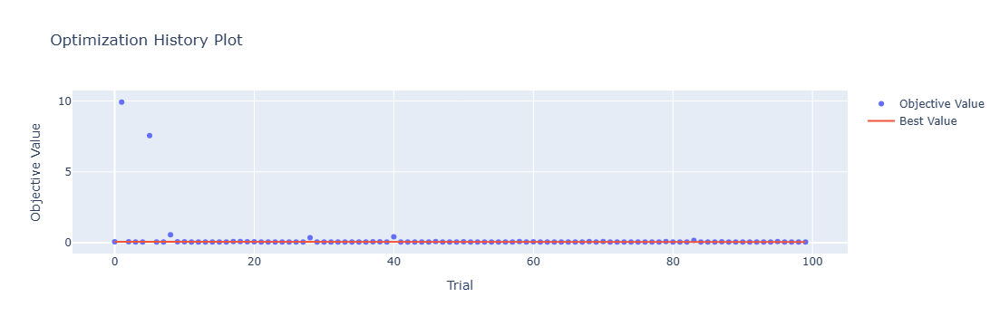

In [4]:
optuna.visualization.plot_optimization_history(study)

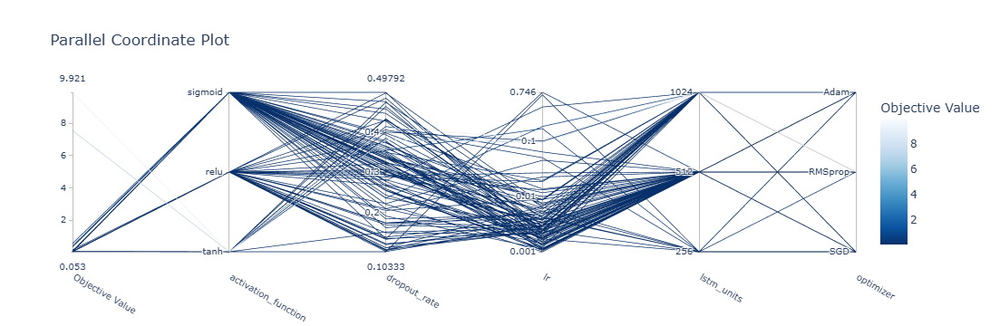

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

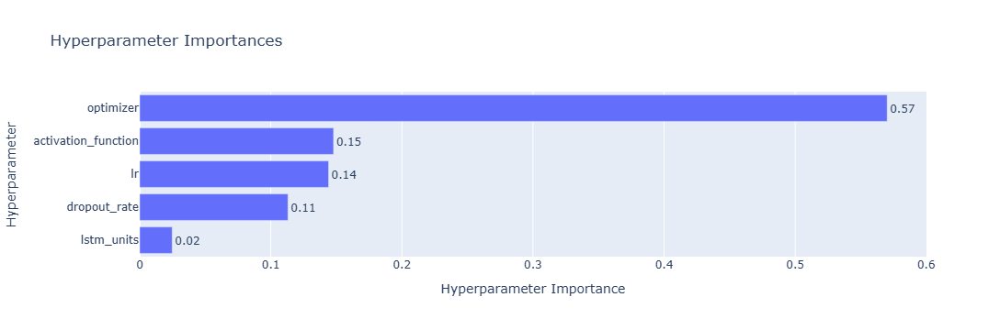

In [6]:
optuna.visualization.plot_param_importances(study)

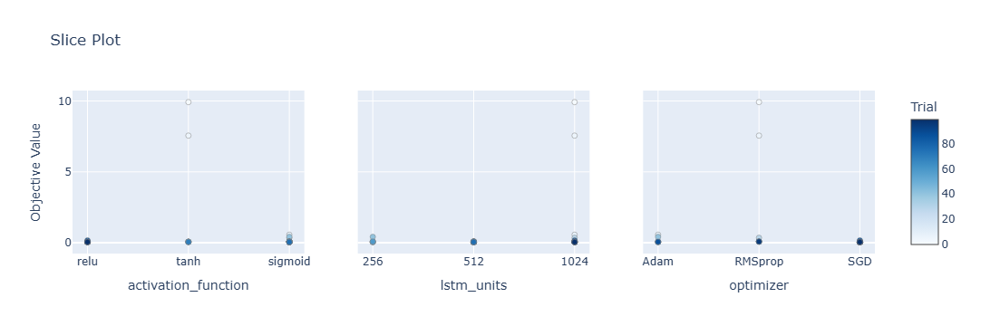

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

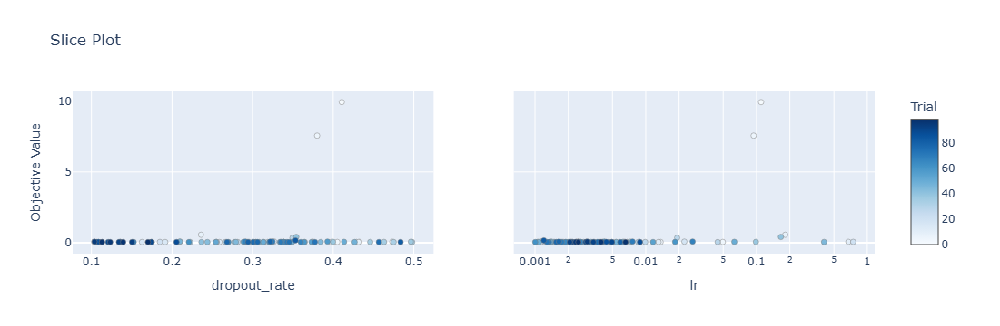

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 55s 383ms/step - loss: 0.4604 - accuracy: 0.1190 - mae: 0.4499 - rmse: 0.4604 - mape: 76.1894 - pearson: 0.2580 - val_loss: 0.2442 - val_accuracy: 0.2000 - val_mae: 0.2341 - val_rmse: 0.2442 - val_mape: 40.1884 - val_pearson: 0.5199
Epoch 2/100
84/84 [==============================] - 25s 296ms/step - loss: 0.1011 - accuracy: 0.5833 - mae: 0.0883 - rmse: 0.1011 - mape: 14.7603 - pearson: 0.6740 - val_loss: 0.0425 - val_accuracy: 0.8000 - val_mae: 0.0349 - val_rmse: 0.0425 - val_mape: 5.9019 - val_pearson: 0.8488
Epoch 3/100
84/84 [==============================] - 24s 287ms/step - loss: 0.0616 - accuracy: 0.7500 - mae: 0.0497 - rmse: 0.0616 - mape: 8.4255 - pearson: 0.7490 -

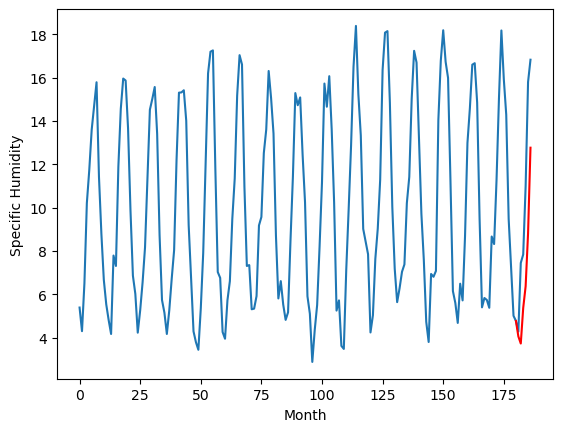

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		5.28		-0.46
6.45		5.01		-1.44
8.66		6.63		-2.03
8.88		7.58		-1.30
11.37		10.02		-1.35
16.12		14.04		-2.08
[180, 181, 182, 183, 184, 185, 186]
[7.05, 5.2831718245148656, 5.005417100489139, 6.627592794001102, 7.5820984163880345, 10.018027953207493, 14.042255572378636]


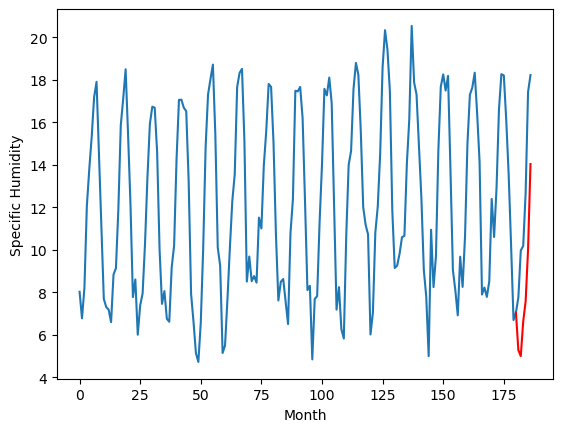

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		7.91		-0.50
8.56		7.66		-0.90
10.41		9.30		-1.11
10.65		10.24		-0.41
13.41		12.70		-0.71
18.03		16.82		-1.21
[180, 181, 182, 183, 184, 185, 186]
[5.06, 7.910658701062202, 7.659541382193565, 9.300916566252708, 10.242758228182792, 12.7020163077116, 16.820916606783868]


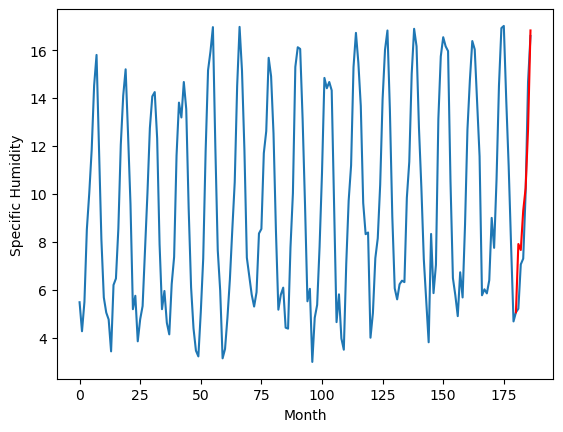

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.38		-0.17
5.46		5.15		-0.31
8.91		6.86		-2.05
9.48		7.81		-1.67
12.99		10.30		-2.69
16.89		14.41		-2.48
[180, 181, 182, 183, 184, 185, 186]
[7.05, 5.3762157592177395, 5.1492212447524075, 6.857610288560391, 7.806008699834347, 10.303537968099118, 14.409223202168942]


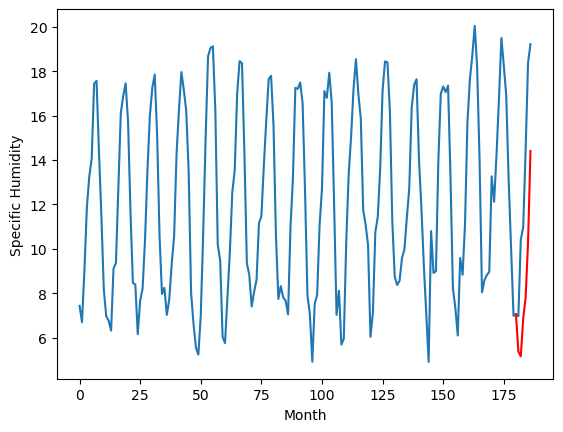

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.37		0.01
6.96		7.12		0.16
9.80		8.85		-0.95
11.20		9.83		-1.37
15.21		12.36		-2.85
18.90		16.36		-2.54
[180, 181, 182, 183, 184, 185, 186]
[5.2, 7.369836718142032, 7.121397882997989, 8.850060373842716, 9.830008954107761, 12.35998556047678, 16.35920521646738]


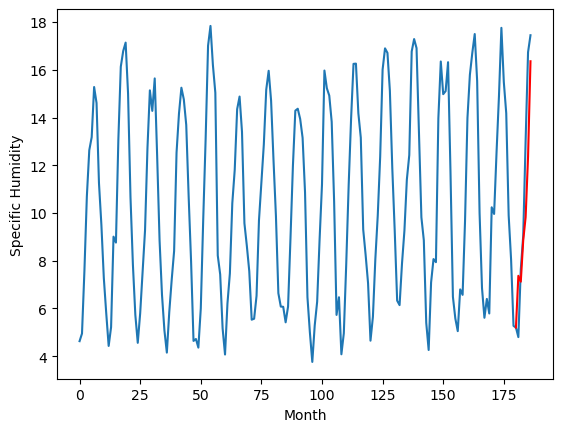

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.50		0.48
4.61		4.26		-0.35
6.18		5.90		-0.28
7.19		6.86		-0.33
9.69		9.33		-0.36
14.95		13.43		-1.52
[180, 181, 182, 183, 184, 185, 186]
[5.16, 4.504153181910515, 4.255240623950958, 5.904211823940277, 6.860385184288025, 9.33018708705902, 13.431463961601256]


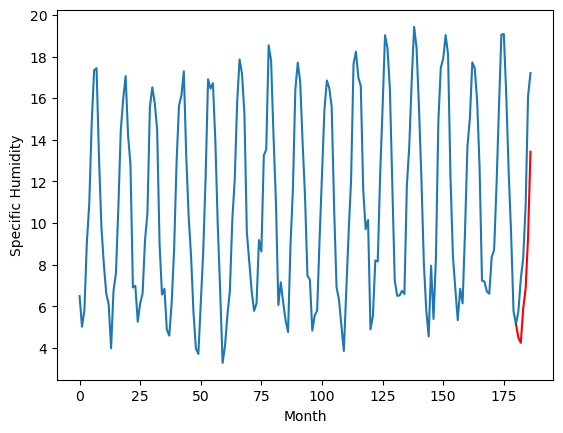

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.38		0.03
6.40		6.12		-0.28
7.99		7.76		-0.23
8.59		8.71		0.12
11.59		11.17		-0.42
15.97		15.31		-0.66
[180, 181, 182, 183, 184, 185, 186]
[4.05, 6.375043116509914, 6.117791555821896, 7.758605979382992, 8.708563826978207, 11.174509070813656, 15.307064078748226]


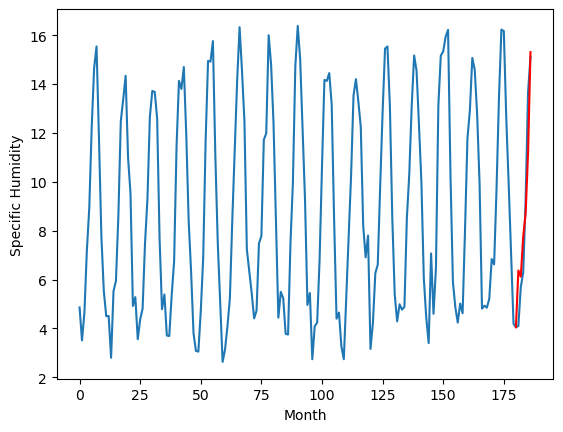

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.71		0.16
4.58		4.45		-0.13
6.20		6.06		-0.14
6.90		7.02		0.12
9.92		9.47		-0.45
14.19		13.67		-0.52
[180, 181, 182, 183, 184, 185, 186]
[3.64, 4.713432029485703, 4.453521803617478, 6.064027503728867, 7.022905901670456, 9.474338845014572, 13.66712792277336]


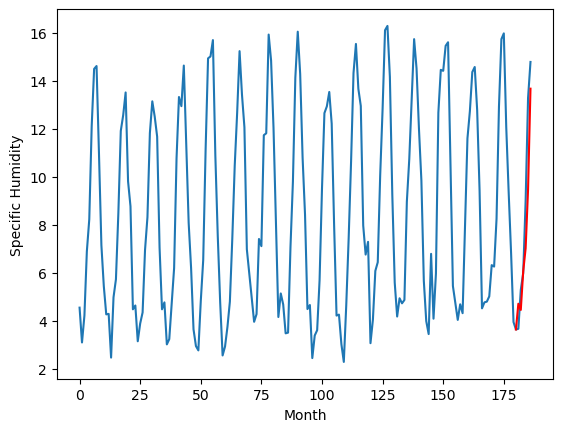

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.44		0.12
3.64		4.16		0.52
6.70		5.86		-0.84
7.43		6.87		-0.56
10.34		9.40		-0.94
15.32		13.63		-1.69
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.442818465828895, 4.162399771809578, 5.856195095181465, 6.871562841534614, 9.397601726651192, 13.634511116147042]


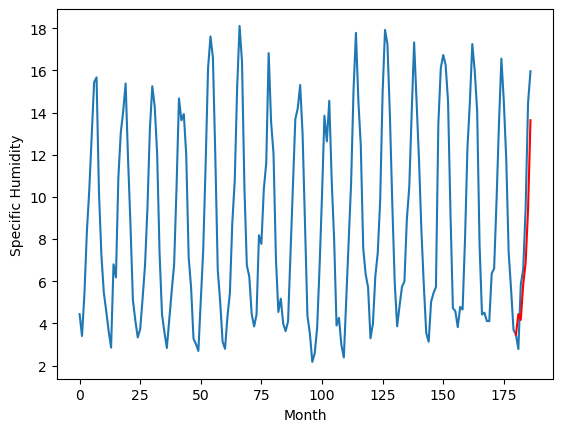

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.31		0.20
3.66		4.02		0.36
5.46		5.71		0.25
6.78		6.75		-0.03
8.87		9.27		0.40
13.64		13.63		-0.01
[180, 181, 182, 183, 184, 185, 186]
[2.93, 4.308226781487465, 4.02191503584385, 5.712966638207436, 6.750655608773232, 9.270127969384195, 13.631290631890298]


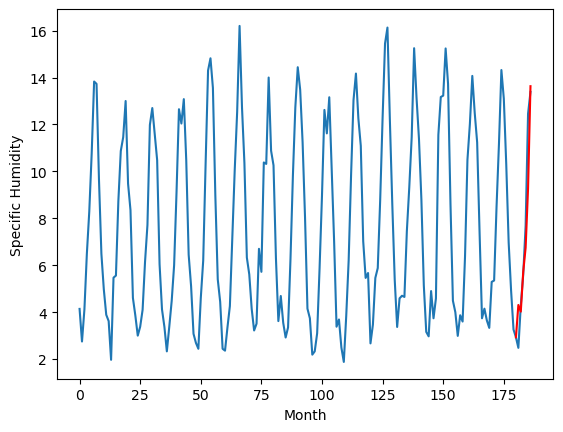

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.98		0.22
3.02		3.66		0.64
4.64		5.34		0.70
6.24		6.40		0.16
7.76		8.89		1.13
12.89		13.27		0.38
[180, 181, 182, 183, 184, 185, 186]
[2.74, 3.975775107145309, 3.6648194634914395, 5.339951976537704, 6.401299222707748, 8.88970206618309, 13.26599715590477]


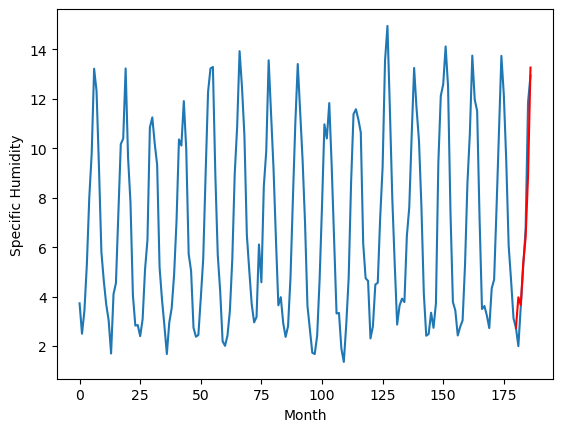

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   4.056896
1                 1    5.74   5.283172
2                 2    8.41   7.910659
3                 3    5.55   5.376216
4                 4    7.36   7.369837
5                 5    4.02   4.504153
6                 6    6.35   6.375043
7                 7    4.55   4.713432
8                 8    4.32   4.442818
9                 9    4.11   4.308227
10               10    3.76   3.975775


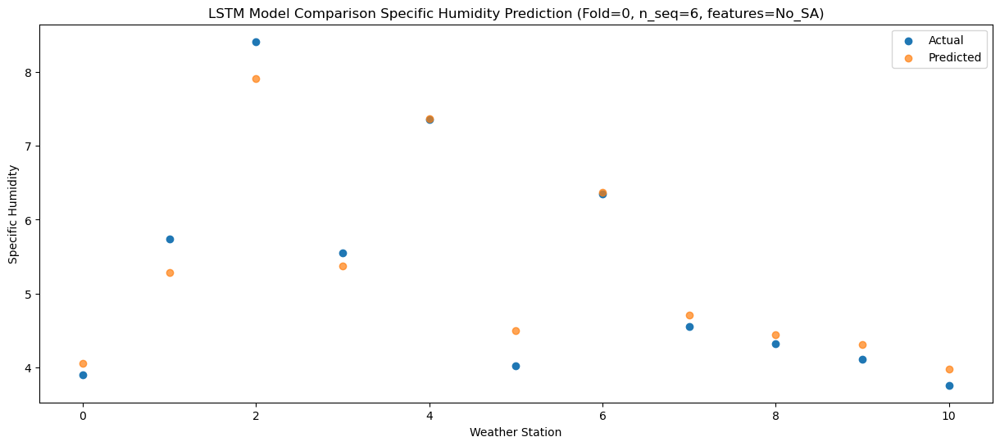

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.728674
1                 1    6.45   5.005417
2                 2    8.56   7.659541
3                 3    5.46   5.149221
4                 4    6.96   7.121398
5                 5    4.61   4.255241
6                 6    6.40   6.117792
7                 7    4.58   4.453522
8                 8    3.64   4.162400
9                 9    3.66   4.021915
10               10    3.02   3.664819


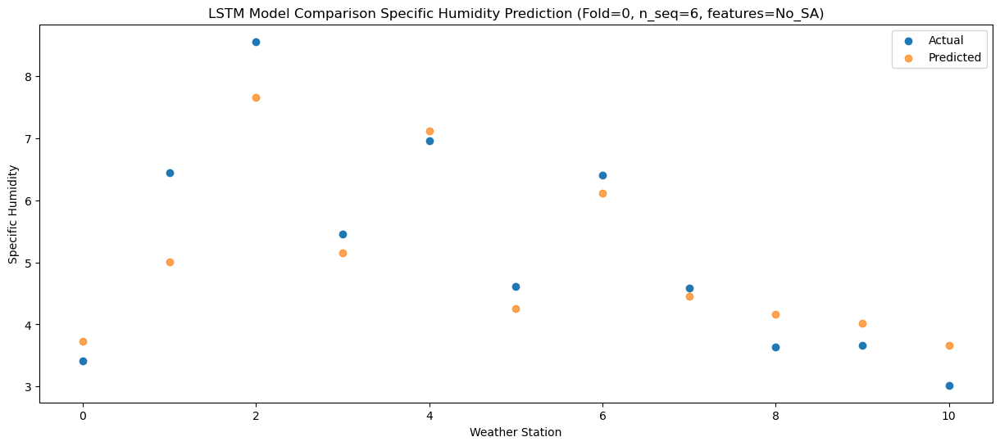

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   5.369971
1                 1    8.66   6.627593
2                 2   10.41   9.300917
3                 3    8.91   6.857610
4                 4    9.80   8.850060
5                 5    6.18   5.904212
6                 6    7.99   7.758606
7                 7    6.20   6.064028
8                 8    6.70   5.856195
9                 9    5.46   5.712967
10               10    4.64   5.339952


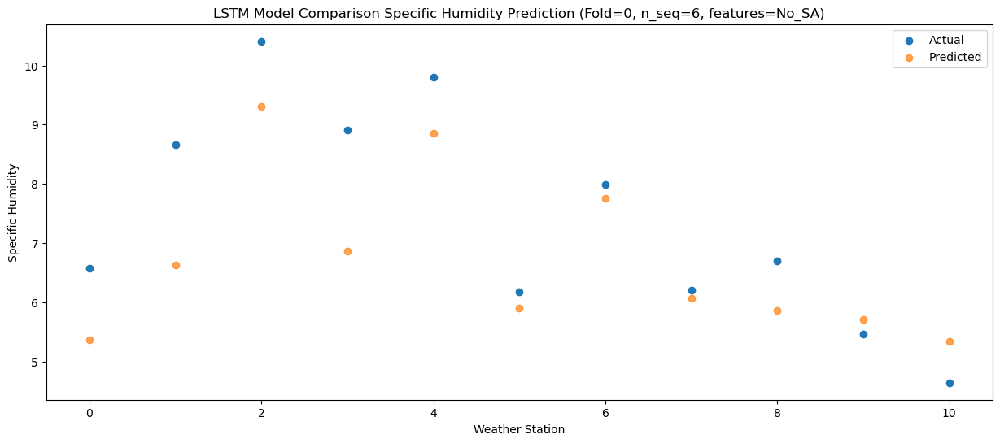

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.97   6.371611
1                 1    8.88   7.582098
2                 2   10.65  10.242758
3                 3    9.48   7.806009
4                 4   11.20   9.830009
5                 5    7.19   6.860385
6                 6    8.59   8.708564
7                 7    6.90   7.022906
8                 8    7.43   6.871563
9                 9    6.78   6.750656
10               10    6.24   6.401299


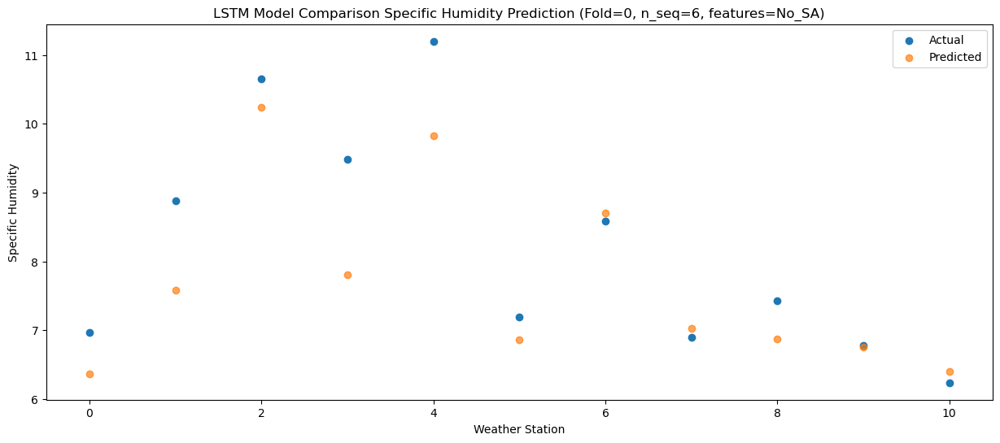

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.12   8.809467
1                 1   11.37  10.018028
2                 2   13.41  12.702016
3                 3   12.99  10.303538
4                 4   15.21  12.359986
5                 5    9.69   9.330187
6                 6   11.59  11.174509
7                 7    9.92   9.474339
8                 8   10.34   9.397602
9                 9    8.87   9.270128
10               10    7.76   8.889702


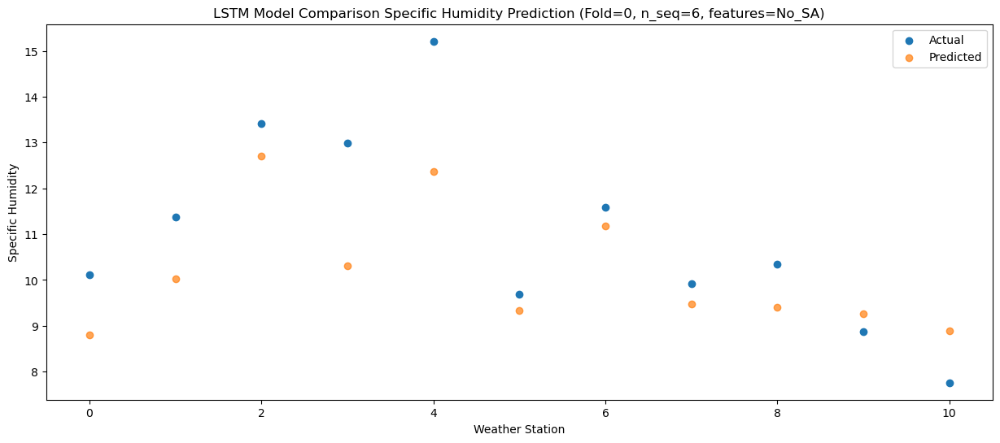

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.93  12.769168
1                 1   16.12  14.042256
2                 2   18.03  16.820917
3                 3   16.89  14.409223
4                 4   18.90  16.359205
5                 5   14.95  13.431464
6                 6   15.97  15.307064
7                 7   14.19  13.667128
8                 8   15.32  13.634511
9                 9   13.64  13.631291
10               10   12.89  13.265997


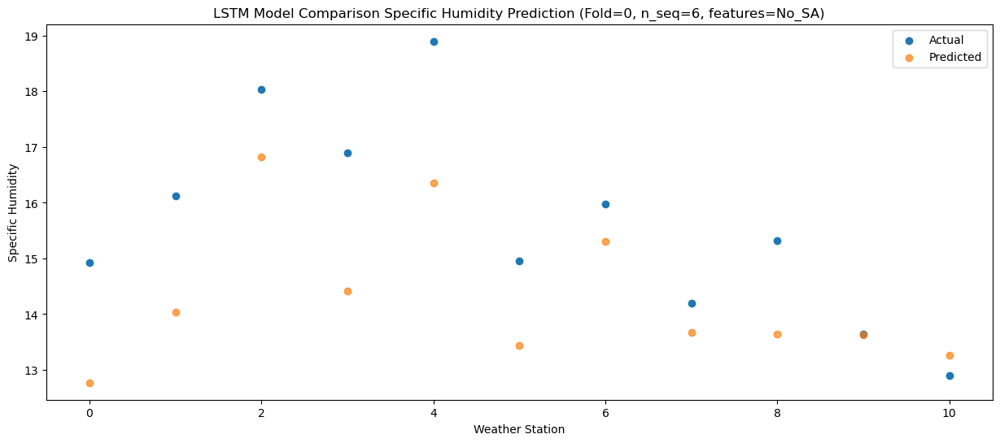

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]
 [ 6.97  8.88 10.65  9.48 11.2   7.19  8.59  6.9   7.43  6.78  6.24]
 [10.12 11.37 13.41 12.99 15.21  9.69 11.59  9.92 10.34  8.87  7.76]
 [14.93 16.12 18.03 16.89 18.9  14.95 15.97 14.19 15.32 13.64 12.89]]
[[ 4.05689582  5.28317182  7.9106587   5.37621576  7.36983672  4.50415318
   6.37504312  4.71343203  4.44281847  4.30822678  3.97577511]
 [ 3.72867384  5.0054171   7.65954138  5.14922124  7.12139788  4.25524062
   6.11779156  4.4535218   4.16239977  4.02191504  3.66481946]
 [ 5.36997071  6.62759279  9.30091657  6.85761029  8.85006037  5.90421182
   7.75860598  6.0640275   5.8561951   5.71296664  5.33995198]
 [ 6.37161115  7.58209842 10.24275823  7.8060087   9.83000895  6.86038518
   8.70856383  7.0229059   6.87156284  6.75065561  6.40129922]
 [ 8.80946734 10.01802795 12.70

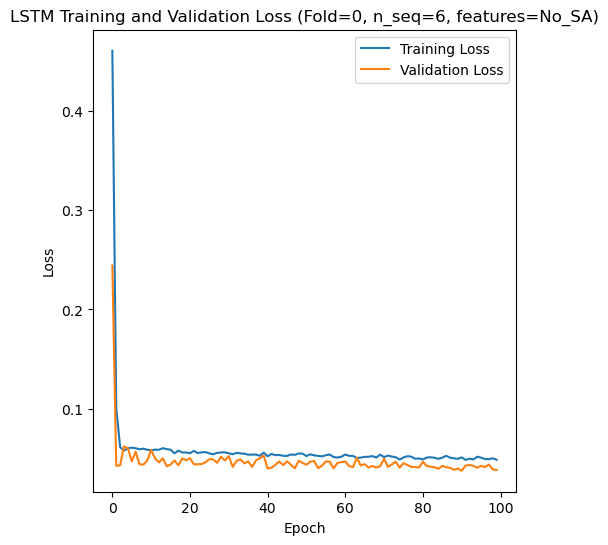

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 51s 305ms/step - loss: 0.4041 - accuracy: 0.0357 - mae: 0.3906 - rmse: 0.4041 - mape: 66.1196 - pearson: 0.1798 - val_loss: 0.1446 - val_accuracy: 0.7000 - val_mae: 0.1233 - val_rmse: 0.1446 - val_mape: 20.5087 - val_pearson: 0.4381
Epoch 2/100
84/84 [==============================] - 19s 230ms/step - loss: 0.0751 - accuracy: 0.7857 - mae: 0.0625 - rmse: 0.0751 - mape: 10.5860 - pearson: 0.7041 - val_loss: 0.0546 - val_accuracy: 0.7000 - val_mae: 0.0433 - val_rmse: 0.0546 - val_mape: 7.4736 - val_pearson: 0.7476
Epoch 3/100
84/84 [==============================] - 24s 283ms/step - loss: 0.0582 - accuracy: 0.8571 - mae: 0.0475 - rmse: 0.0582 - mape: 8.0181 - pearson: 0.7747 -

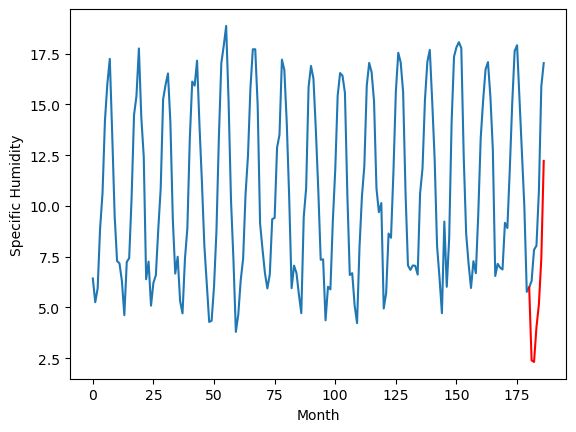

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		6.48		0.03
6.64		6.45		-0.19
8.17		8.20		0.03
8.53		9.34		0.81
11.45		11.65		0.20
15.43		16.52		1.09
[180, 181, 182, 183, 184, 185, 186]
[4.15, 6.484291285574436, 6.4474715667963025, 8.20031148970127, 9.33544880926609, 11.646703310608864, 16.521238871216774]


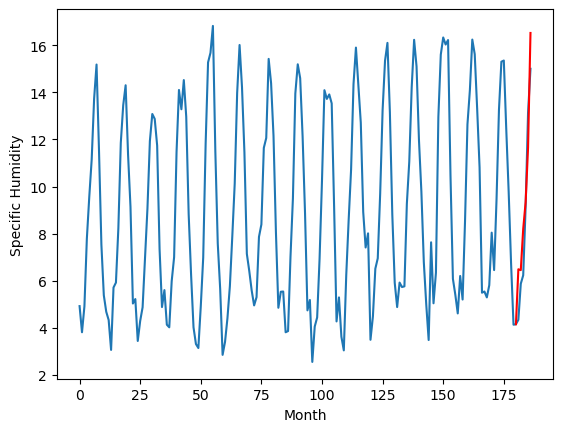

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.00		-0.07
5.07		4.99		-0.08
7.69		6.77		-0.92
7.40		7.89		0.49
10.24		10.25		0.01
14.76		15.15		0.39
[180, 181, 182, 183, 184, 185, 186]
[5.12, 4.999317547380924, 4.988677463568747, 6.7707327223196625, 7.886778912581503, 10.251245341338217, 15.153656325377524]


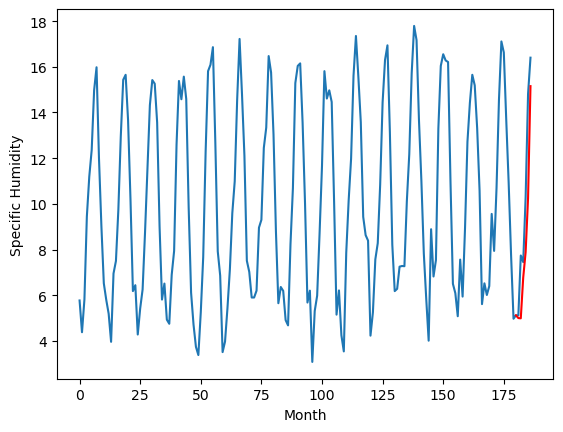

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		5.86		0.43
5.50		5.78		0.28
8.14		7.55		-0.59
9.48		8.62		-0.86
13.37		11.02		-2.35
16.56		15.80		-0.76
[180, 181, 182, 183, 184, 185, 186]
[6.35, 5.855738949477672, 5.776017073988914, 7.547207598090171, 8.618014816641807, 11.02389264523983, 15.803381208777427]


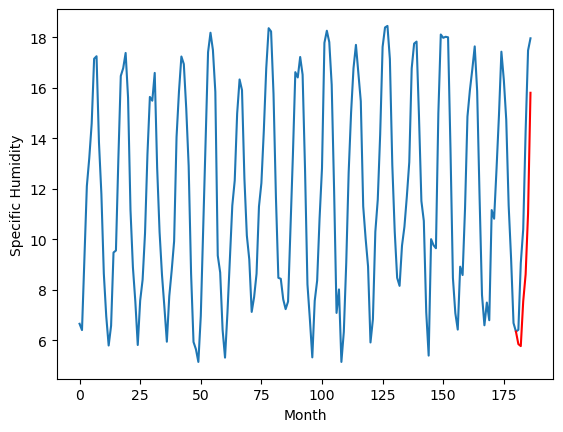

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		6.76		0.35
6.45		6.64		0.19
9.17		8.43		-0.74
10.43		9.48		-0.95
14.46		11.94		-2.52
17.87		16.67		-1.20
[180, 181, 182, 183, 184, 185, 186]
[6.08, 6.75766910225153, 6.64008106648922, 8.429463643431664, 9.480436343550682, 11.938053864836693, 16.665371674895287]


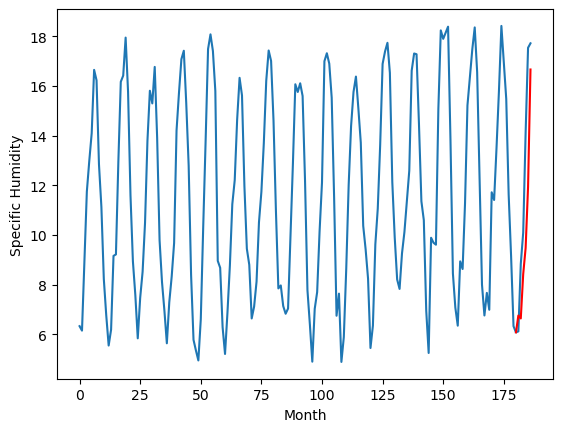

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		6.40		-0.76
6.53		6.20		-0.33
7.32		7.91		0.59
8.62		8.89		0.27
12.93		11.28		-1.65
15.10		15.81		0.71
[180, 181, 182, 183, 184, 185, 186]
[3.92, 6.396061921417713, 6.203408652842045, 7.90866332679987, 8.889526480734348, 11.27658187776804, 15.807209605276585]


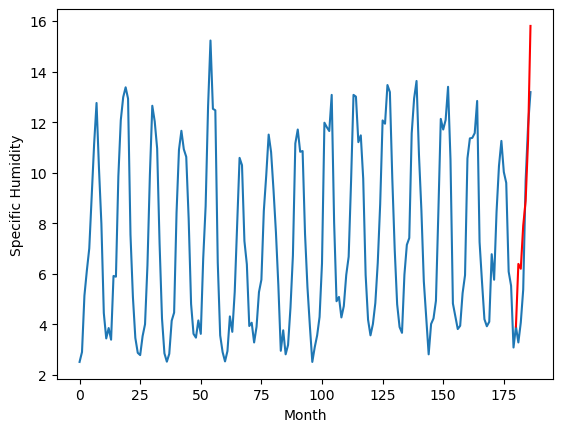

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		2.59		0.18
2.53		2.51		-0.02
4.09		4.26		0.17
4.71		5.32		0.61
7.64		7.74		0.10
11.99		12.47		0.48
[180, 181, 182, 183, 184, 185, 186]
[4.16, 2.5912468028068543, 2.511365410387516, 4.263389345705509, 5.32327770859003, 7.735410687029361, 12.47356748253107]


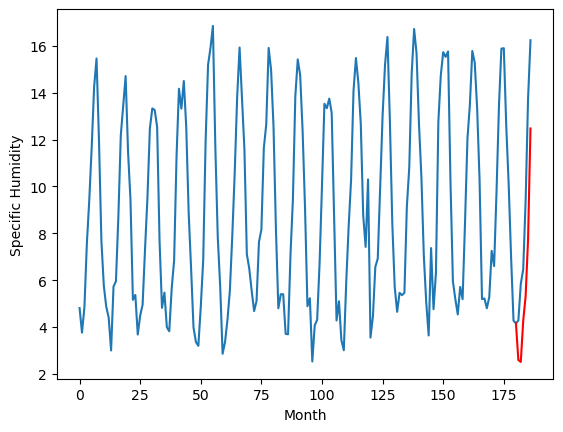

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		4.90		0.22
4.16		4.79		0.63
6.89		6.59		-0.30
8.12		7.67		-0.45
11.33		10.13		-1.20
16.09		14.89		-1.20
[180, 181, 182, 183, 184, 185, 186]
[3.84, 4.89975788205862, 4.790434916913509, 6.586783250272274, 7.671843846738338, 10.133985837399958, 14.893107255399226]


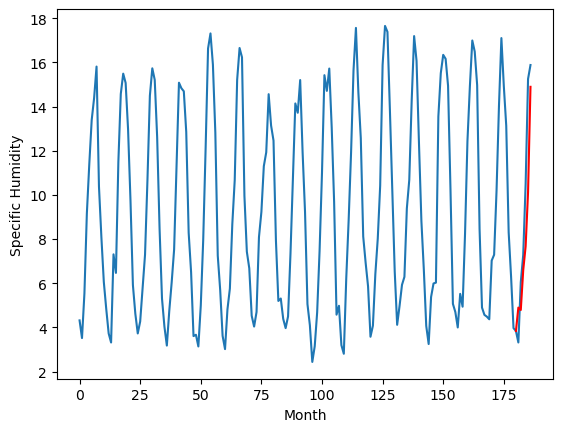

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.39		-0.09
3.67		4.22		0.55
6.28		5.99		-0.29
7.44		7.06		-0.38
11.66		9.51		-2.15
14.80		14.14		-0.66
[180, 181, 182, 183, 184, 185, 186]
[3.73, 4.392307370603085, 4.21575207978487, 5.98992998868227, 7.05649013787508, 9.513507082760334, 14.14196319848299]


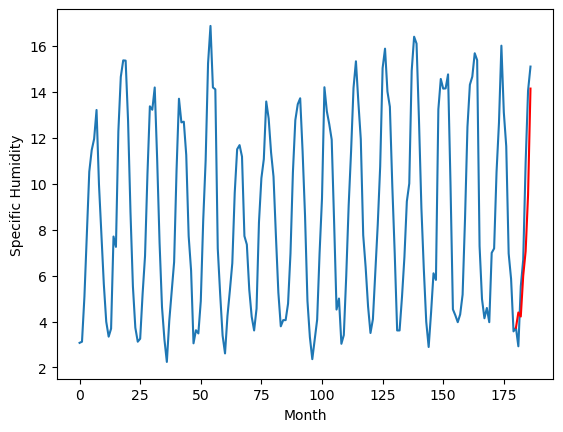

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		3.13		-0.13
2.52		2.89		0.37
4.34		4.61		0.27
4.51		5.61		1.10
9.66		8.03		-1.63
12.65		12.51		-0.14
[180, 181, 182, 183, 184, 185, 186]
[2.83, 3.1314725835621355, 2.885997917205095, 4.605821158438921, 5.6087773104012015, 8.025368239432574, 12.510966326743365]


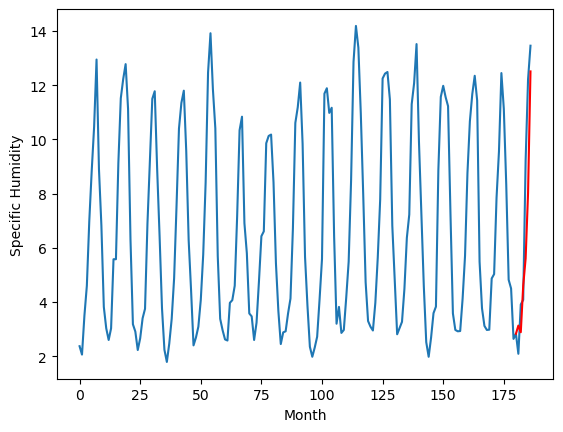

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		2.34		0.70
1.68		2.17		0.49
2.92		3.84		0.92
4.29		4.93		0.64
5.82		7.20		1.38
11.14		11.89		0.75
[180, 181, 182, 183, 184, 185, 186]
[2.69, 2.33882438659668, 2.1654923659563066, 3.8362984162569047, 4.934241483807564, 7.204502294659615, 11.891775797009469]


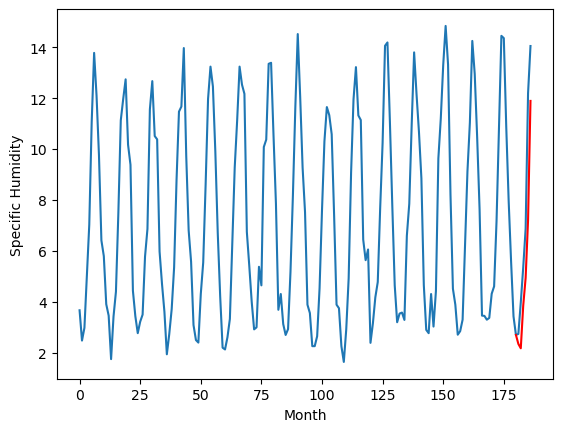

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   2.397846
1                 1    6.45   6.484291
2                 2    5.07   4.999318
3                 3    5.43   5.855739
4                 4    6.41   6.757669
5                 5    7.16   6.396062
6                 6    2.41   2.591247
7                 7    4.68   4.899758
8                 8    4.48   4.392307
9                 9    3.26   3.131473
10               10    1.64   2.338824


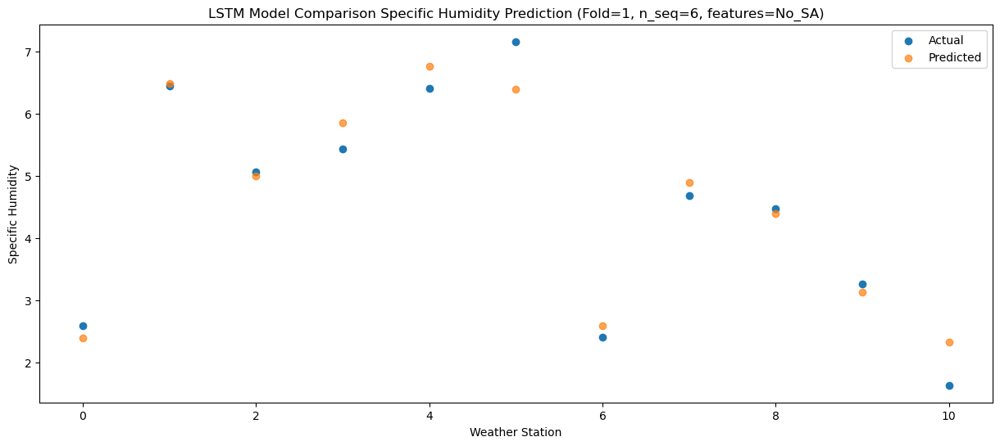

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91   2.320967
1                 1    6.64   6.447472
2                 2    5.07   4.988677
3                 3    5.50   5.776017
4                 4    6.45   6.640081
5                 5    6.53   6.203409
6                 6    2.53   2.511365
7                 7    4.16   4.790435
8                 8    3.67   4.215752
9                 9    2.52   2.885998
10               10    1.68   2.165492


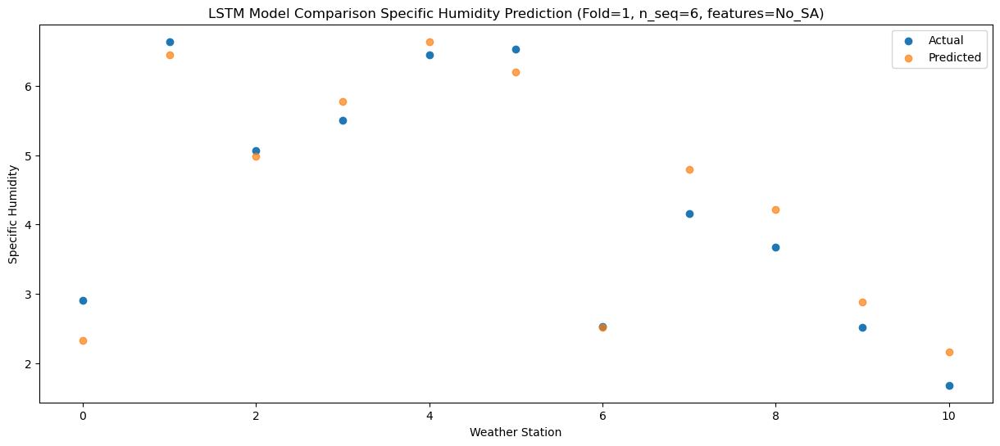

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   4.030292
1                 1    8.17   8.200311
2                 2    7.69   6.770733
3                 3    8.14   7.547208
4                 4    9.17   8.429464
5                 5    7.32   7.908663
6                 6    4.09   4.263389
7                 7    6.89   6.586783
8                 8    6.28   5.989930
9                 9    4.34   4.605821
10               10    2.92   3.836298


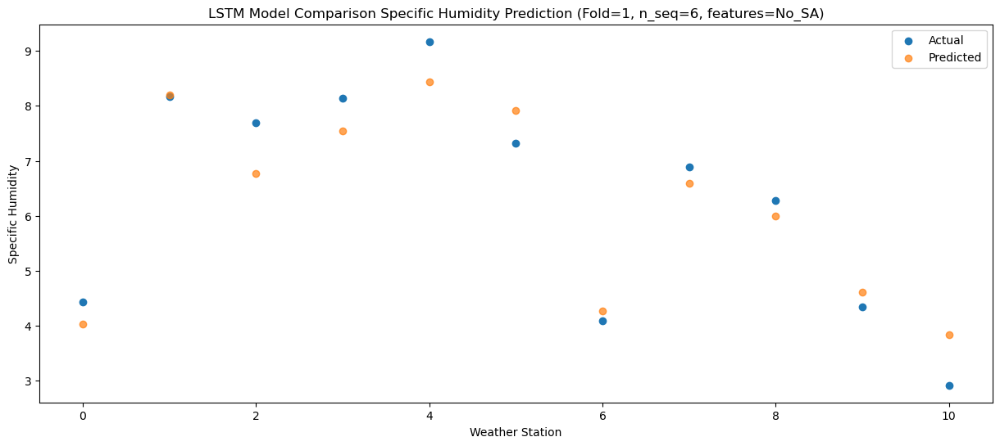

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    4.64   5.149400
1                 1    8.53   9.335449
2                 2    7.40   7.886779
3                 3    9.48   8.618015
4                 4   10.43   9.480436
5                 5    8.62   8.889526
6                 6    4.71   5.323278
7                 7    8.12   7.671844
8                 8    7.44   7.056490
9                 9    4.51   5.608777
10               10    4.29   4.934241


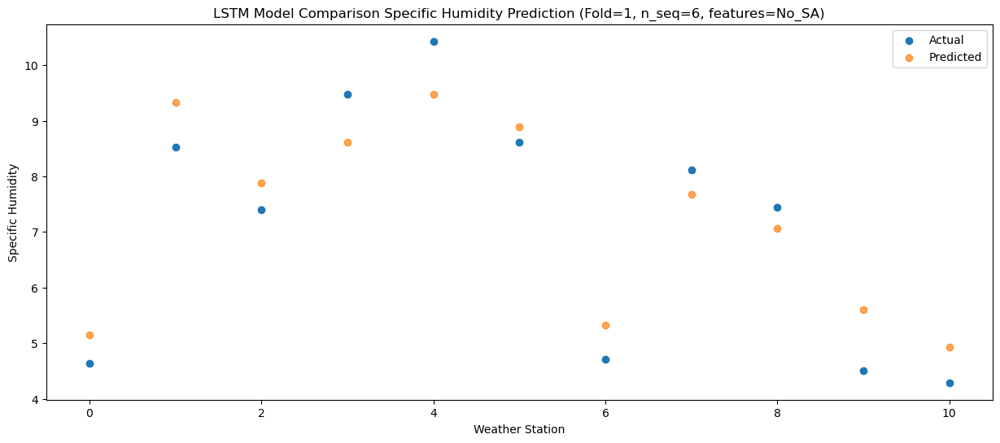

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    7.32   7.409715
1                 1   11.45  11.646703
2                 2   10.24  10.251245
3                 3   13.37  11.023893
4                 4   14.46  11.938054
5                 5   12.93  11.276582
6                 6    7.64   7.735411
7                 7   11.33  10.133986
8                 8   11.66   9.513507
9                 9    9.66   8.025368
10               10    5.82   7.204502


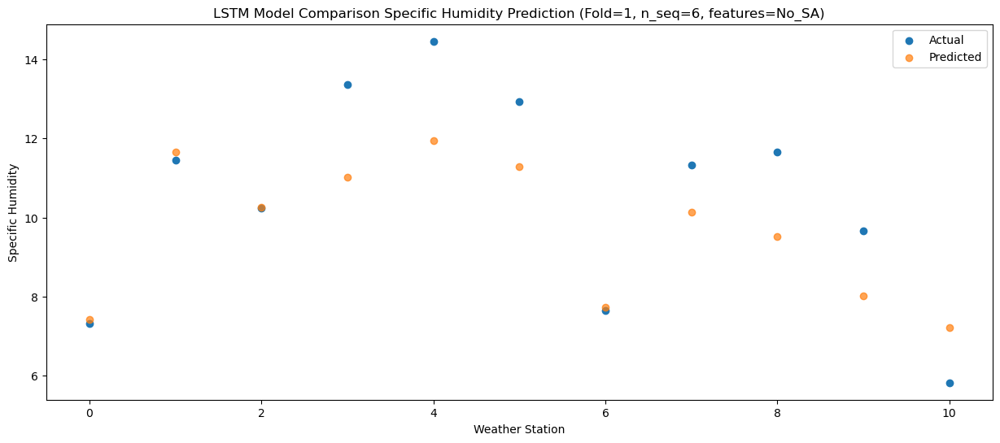

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   12.48  12.216131
1                 1   15.43  16.521239
2                 2   14.76  15.153656
3                 3   16.56  15.803381
4                 4   17.87  16.665372
5                 5   15.10  15.807210
6                 6   11.99  12.473567
7                 7   16.09  14.893107
8                 8   14.80  14.141963
9                 9   12.65  12.510966
10               10   11.14  11.891776


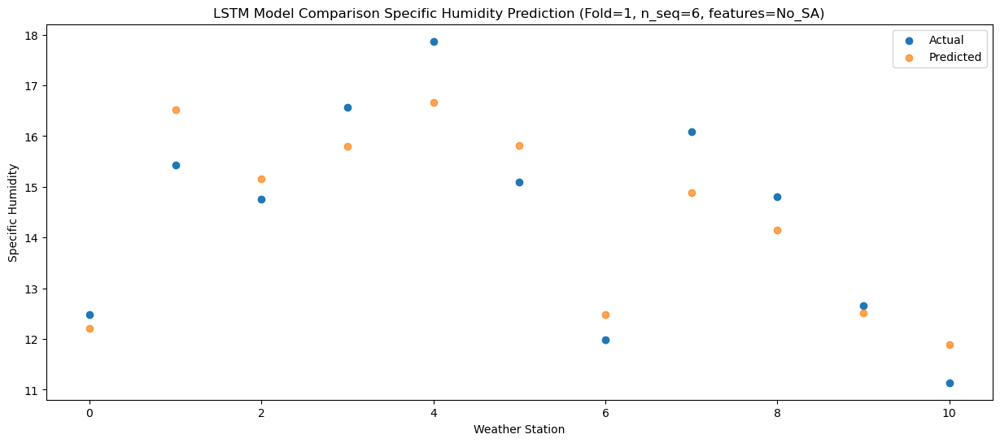

f, t:
[[ 2.59  6.45  5.07  5.43  6.41  7.16  2.41  4.68  4.48  3.26  1.64]
 [ 2.91  6.64  5.07  5.5   6.45  6.53  2.53  4.16  3.67  2.52  1.68]
 [ 4.44  8.17  7.69  8.14  9.17  7.32  4.09  6.89  6.28  4.34  2.92]
 [ 4.64  8.53  7.4   9.48 10.43  8.62  4.71  8.12  7.44  4.51  4.29]
 [ 7.32 11.45 10.24 13.37 14.46 12.93  7.64 11.33 11.66  9.66  5.82]
 [12.48 15.43 14.76 16.56 17.87 15.1  11.99 16.09 14.8  12.65 11.14]]
[[ 2.39784579  6.48429129  4.99931755  5.85573895  6.7576691   6.39606192
   2.5912468   4.89975788  4.39230737  3.13147258  2.33882439]
 [ 2.32096723  6.44747157  4.98867746  5.77601707  6.64008107  6.20340865
   2.51136541  4.79043492  4.21575208  2.88599792  2.16549237]
 [ 4.03029207  8.20031149  6.77073272  7.5472076   8.42946364  7.90866333
   4.26338935  6.58678325  5.98992999  4.60582116  3.83629842]
 [ 5.14940003  9.33544881  7.88677891  8.61801482  9.48043634  8.88952648
   5.32327771  7.67184385  7.05649014  5.60877731  4.93424148]
 [ 7.40971545 11.64670331 10.25

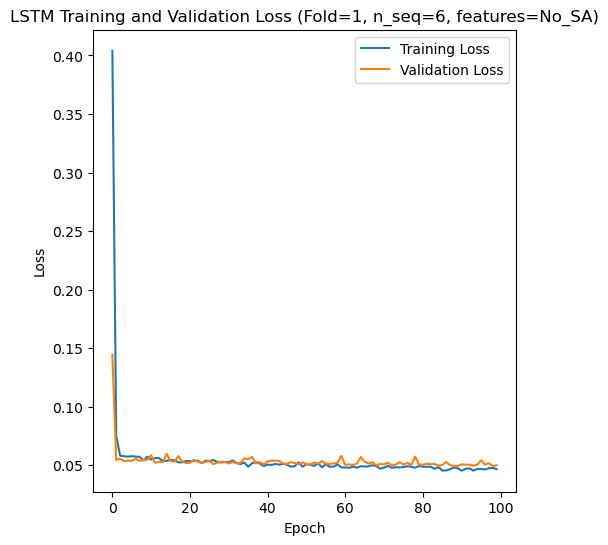

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 58s 335ms/step - loss: 0.4484 - accuracy: 0.3095 - mae: 0.4386 - rmse: 0.4484 - mape: 74.1522 - pearson: 0.2862 - val_loss: 0.2120 - val_accuracy: 1.0000 - val_mae: 0.2009 - val_rmse: 0.2120 - val_mape: 33.2474 - val_pearson: 0.6759
Epoch 2/100
84/84 [==============================] - 20s 238ms/step - loss: 0.0802 - accuracy: 0.7500 - mae: 0.0694 - rmse: 0.0802 - mape: 11.6259 - pearson: 0.7546 - val_loss: 0.0444 - val_accuracy: 1.0000 - val_mae: 0.0385 - val_rmse: 0.0444 - val_mape: 6.6814 - val_pearson: 0.9038
Epoch 3/100
84/84 [==============================] - 19s 231ms/step - loss: 0.0578 - accuracy: 0.7976 - mae: 0.0470 - rmse: 0.0578 - mape: 7.9758 - pearson: 0.7826 -

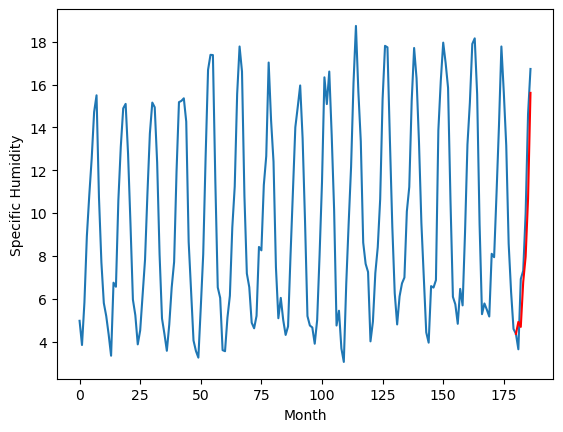

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.83		-0.09
4.24		4.49		0.25
6.09		6.49		0.40
6.21		7.58		1.37
11.33		10.25		-1.08
14.24		14.93		0.69
[180, 181, 182, 183, 184, 185, 186]
[2.82, 4.829235763549804, 4.490923316478729, 6.485107810497284, 7.575079352855682, 10.24684062719345, 14.926051290035247]


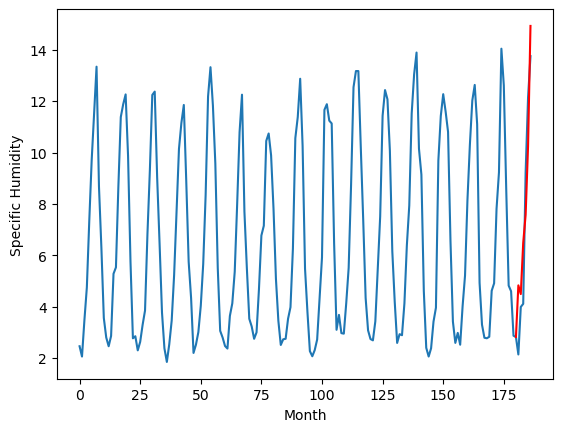

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.33		-0.62
5.08		2.04		-3.04
5.30		3.96		-1.34
6.27		4.99		-1.28
7.58		7.63		0.05
11.36		12.33		0.97
[180, 181, 182, 183, 184, 185, 186]
[9.16, 2.330181083679199, 2.043500385284424, 3.960333070755005, 4.987080059051514, 7.631861886978149, 12.325106821060182]


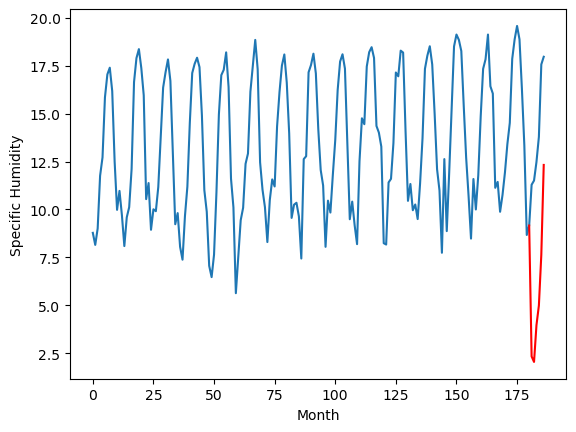

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.59		0.89
7.87		8.28		0.41
8.51		10.17		1.66
9.86		11.22		1.36
11.54		13.75		2.21
16.14		18.49		2.35
[180, 181, 182, 183, 184, 185, 186]
[2.44, 8.591179161071777, 8.28372278690338, 10.170517354011535, 11.217958598136901, 13.754669337272643, 18.48909869670868]


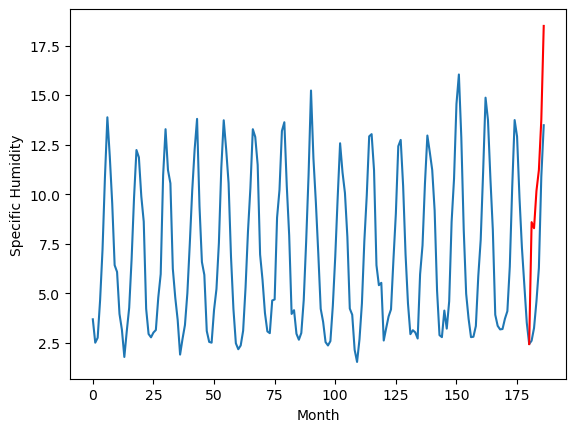

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.54		-0.28
3.80		3.29		-0.51
7.09		5.23		-1.86
7.11		6.28		-0.83
10.31		8.94		-1.37
14.20		13.70		-0.50
[180, 181, 182, 183, 184, 185, 186]
[6.65, 3.538250702023506, 3.2884509587287902, 5.228273870944976, 6.284087660312652, 8.94133091211319, 13.697661402225494]


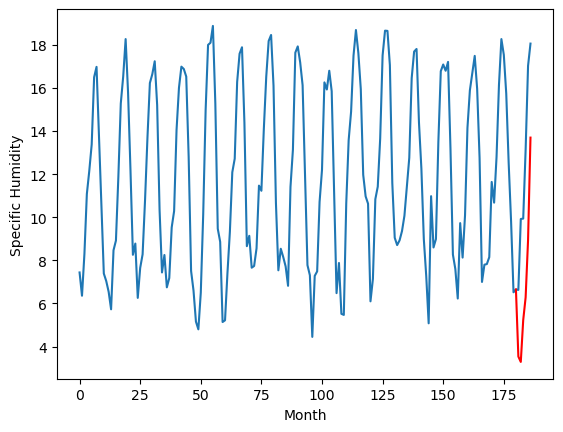

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.30		-0.01
7.26		7.04		-0.22
10.25		8.99		-1.26
11.82		10.05		-1.77
16.65		12.74		-3.91
19.29		17.42		-1.87
[180, 181, 182, 183, 184, 185, 186]
[6.19, 7.30255519092083, 7.0370299988985066, 8.988780038952829, 10.052939551472665, 12.741519826054574, 17.42451800644398]


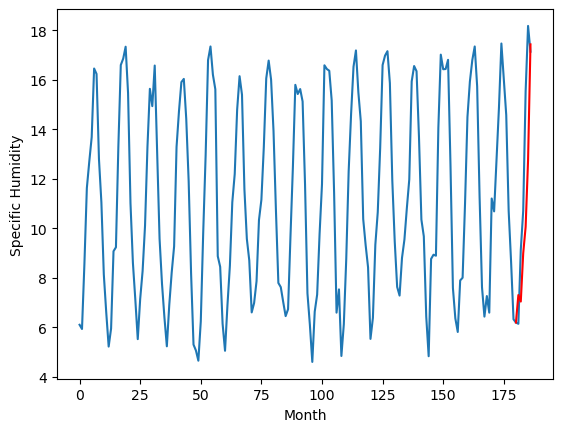

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		5.98		-0.02
5.67		5.71		0.04
8.53		7.71		-0.82
9.85		8.80		-1.05
14.05		11.55		-2.50
17.80		16.23		-1.57
[180, 181, 182, 183, 184, 185, 186]
[4.78, 5.981815567612648, 5.709629020094871, 7.706817349791526, 8.80134149491787, 11.547423085570335, 16.234528264403345]


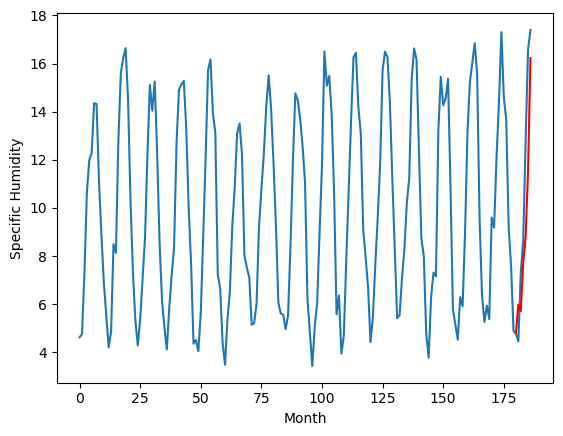

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.46		-0.44
4.77		4.07		-0.70
4.86		5.87		1.01
5.16		6.83		1.67
5.28		9.43		4.15
7.94		13.84		5.90
[180, 181, 182, 183, 184, 185, 186]
[2.61, 4.463482539057732, 4.0737533670663835, 5.873456726670265, 6.834877501130104, 9.43154264509678, 13.842815647721292]


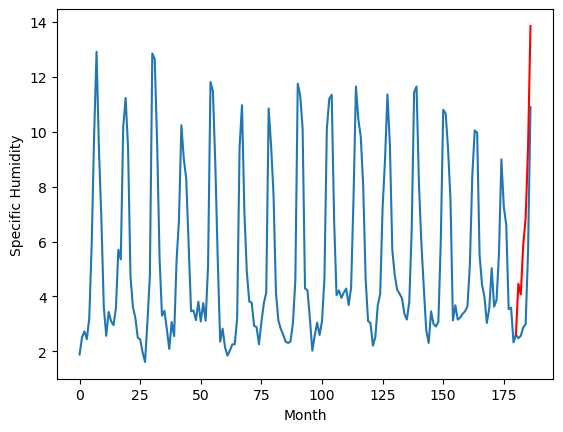

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		1.69		-1.05
3.27		1.14		-2.13
3.38		2.71		-0.67
4.70		3.49		-1.21
6.18		5.89		-0.29
7.43		9.94		2.51
[180, 181, 182, 183, 184, 185, 186]
[4.6, 1.6851390743255614, 1.1438407444953917, 2.7065268301963803, 3.4889874005317685, 5.888306572437286, 9.943806602954865]


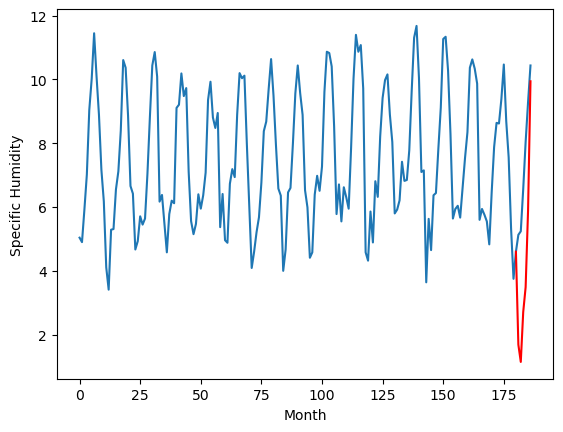

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.88		-0.04
4.99		4.50		-0.49
6.72		6.26		-0.46
7.25		7.17		-0.08
9.96		9.72		-0.24
14.46		14.17		-0.29
[180, 181, 182, 183, 184, 185, 186]
[4.27, 4.87988057076931, 4.497982257008553, 6.262367838025093, 7.169428938031197, 9.716501587033271, 14.167542808651923]


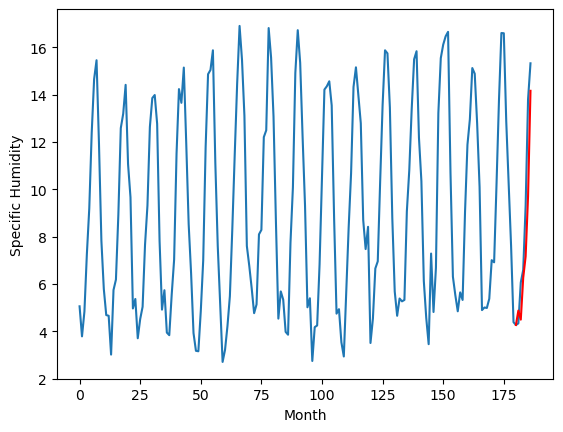

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.91		-0.16
5.31		4.59		-0.72
6.34		6.42		0.08
6.95		7.39		0.44
9.62		9.97		0.35
13.72		14.59		0.87
[180, 181, 182, 183, 184, 185, 186]
[3.91, 4.906851289272308, 4.587709662914276, 6.419418451786041, 7.393411931991577, 9.969501791000365, 14.592464742660521]


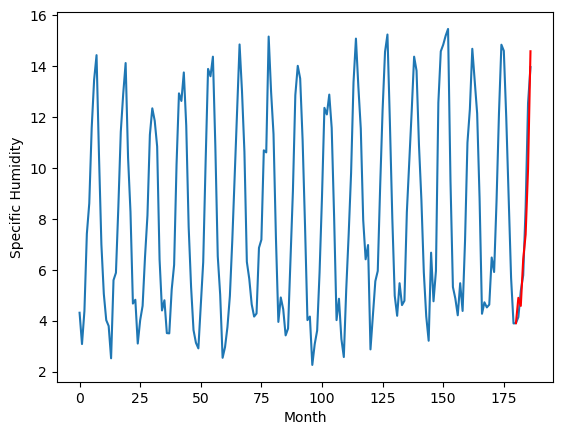

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   4.919157
1                 1    4.92   4.829236
2                 2    2.95   2.330181
3                 3    7.70   8.591179
4                 4    3.82   3.538251
5                 5    7.31   7.302555
6                 6    6.00   5.981816
7                 7    4.90   4.463483
8                 8    2.74   1.685139
9                 9    4.92   4.879881
10               10    5.07   4.906851


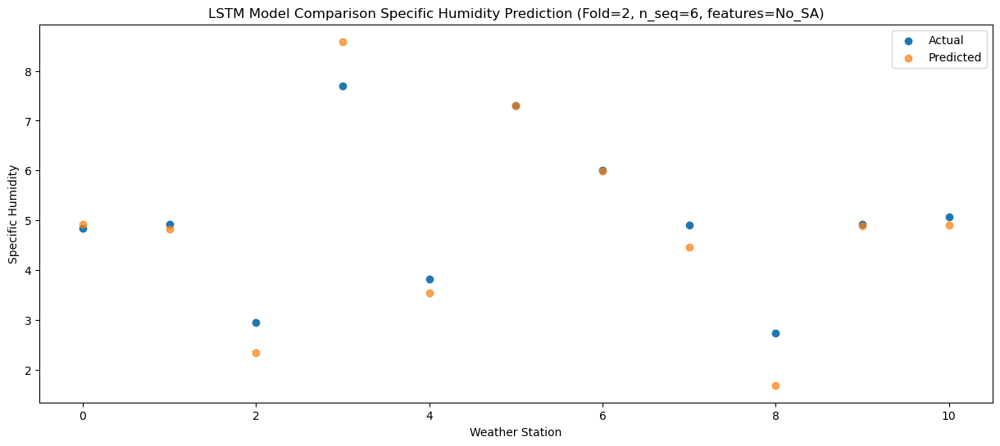

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   4.684777
1                 1    4.24   4.490923
2                 2    5.08   2.043500
3                 3    7.87   8.283723
4                 4    3.80   3.288451
5                 5    7.26   7.037030
6                 6    5.67   5.709629
7                 7    4.77   4.073753
8                 8    3.27   1.143841
9                 9    4.99   4.497982
10               10    5.31   4.587710


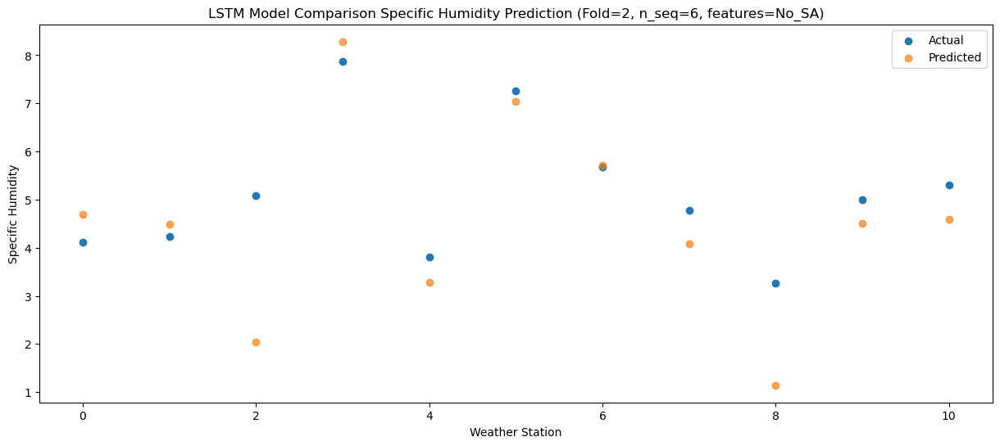

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   6.781296
1                 1    6.09   6.485108
2                 2    5.30   3.960333
3                 3    8.51  10.170517
4                 4    7.09   5.228274
5                 5   10.25   8.988780
6                 6    8.53   7.706817
7                 7    4.86   5.873457
8                 8    3.38   2.706527
9                 9    6.72   6.262368
10               10    6.34   6.419418


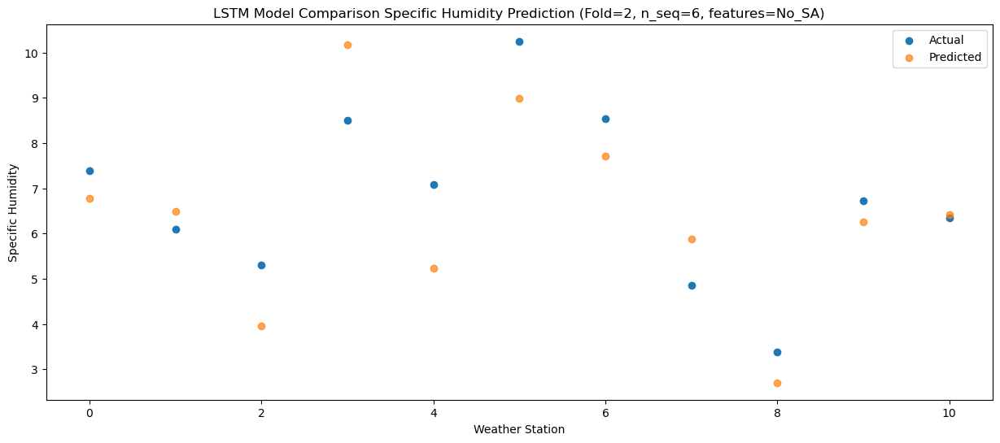

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.78   7.960717
1                 1    6.21   7.575079
2                 2    6.27   4.987080
3                 3    9.86  11.217959
4                 4    7.11   6.284088
5                 5   11.82  10.052940
6                 6    9.85   8.801341
7                 7    5.16   6.834878
8                 8    4.70   3.488987
9                 9    7.25   7.169429
10               10    6.95   7.393412


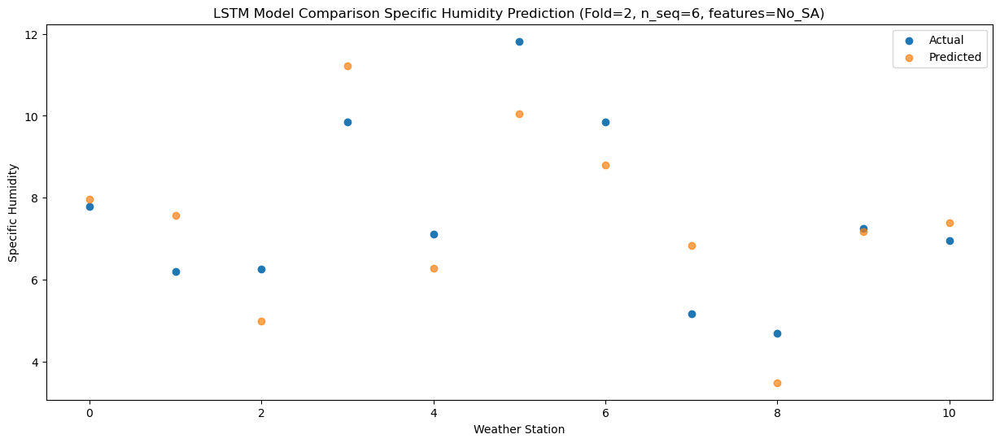

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.45  10.672463
1                 1   11.33  10.246841
2                 2    7.58   7.631862
3                 3   11.54  13.754669
4                 4   10.31   8.941331
5                 5   16.65  12.741520
6                 6   14.05  11.547423
7                 7    5.28   9.431543
8                 8    6.18   5.888307
9                 9    9.96   9.716502
10               10    9.62   9.969502


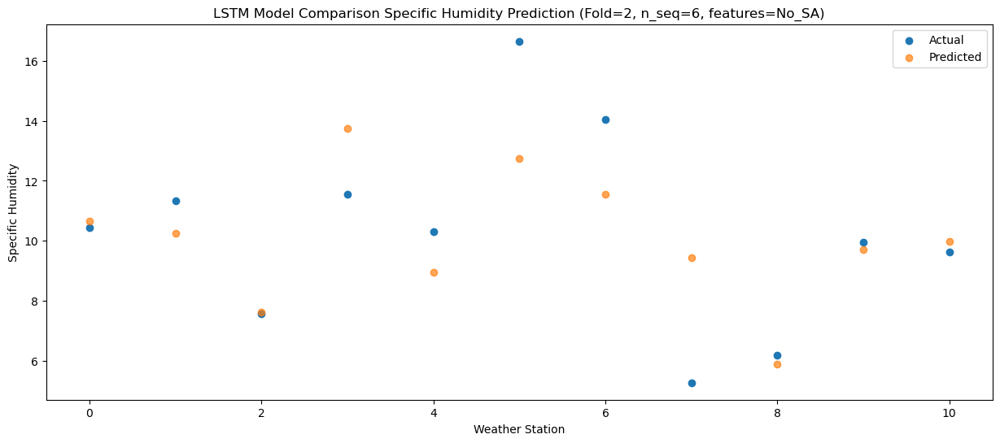

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.10  15.612955
1                 1   14.24  14.926051
2                 2   11.36  12.325107
3                 3   16.14  18.489099
4                 4   14.20  13.697661
5                 5   19.29  17.424518
6                 6   17.80  16.234528
7                 7    7.94  13.842816
8                 8    7.43   9.943807
9                 9   14.46  14.167543
10               10   13.72  14.592465


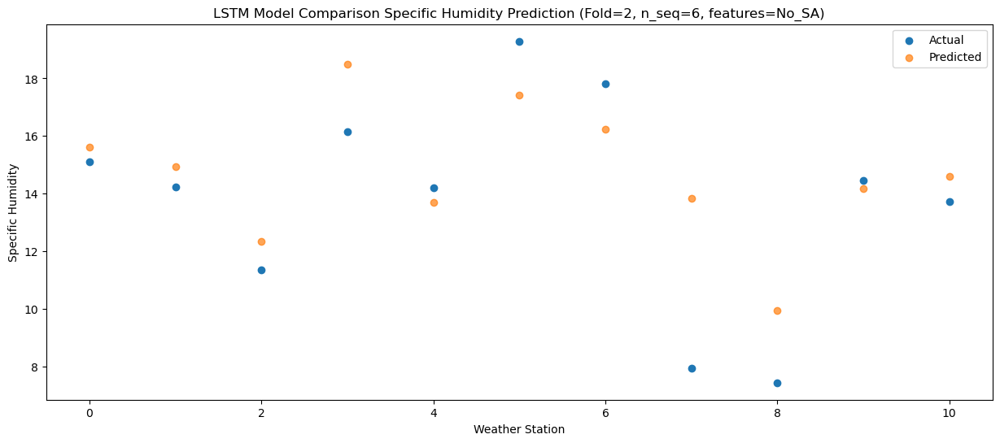

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]
 [ 7.78  6.21  6.27  9.86  7.11 11.82  9.85  5.16  4.7   7.25  6.95]
 [10.45 11.33  7.58 11.54 10.31 16.65 14.05  5.28  6.18  9.96  9.62]
 [15.1  14.24 11.36 16.14 14.2  19.29 17.8   7.94  7.43 14.46 13.72]]
[[ 4.91915674  4.82923576  2.33018108  8.59117916  3.5382507   7.30255519
   5.98181557  4.46348254  1.68513907  4.87988057  4.90685129]
 [ 4.68477738  4.49092332  2.04350039  8.28372279  3.28845096  7.03703
   5.70962902  4.07375337  1.14384074  4.49798226  4.58770966]
 [ 6.78129637  6.48510781  3.96033307 10.17051735  5.22827387  8.98878004
   7.70681735  5.87345673  2.70652683  6.26236784  6.41941845]
 [ 7.96071732  7.57507935  4.98708006 11.2179586   6.28408766 10.05293955
   8.80134149  6.8348775   3.4889874   7.16942894  7.39341193]
 [10.67246306 10.24684063  7.63186

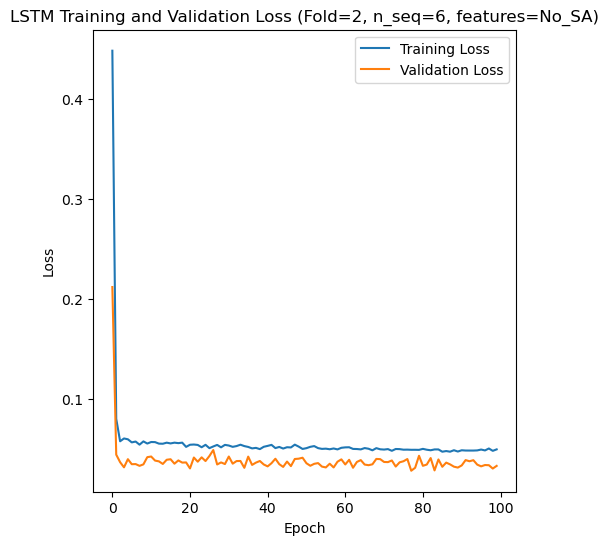

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 63s 391ms/step - loss: 0.4939 - accuracy: 0.0000e+00 - mae: 0.4804 - rmse: 0.4939 - mape: 80.5685 - pearson: 0.0827 - val_loss: 0.2917 - val_accuracy: 0.0000e+00 - val_mae: 0.2788 - val_rmse: 0.2917 - val_mape: 48.3094 - val_pearson: 0.1475
Epoch 2/100
84/84 [==============================] - 24s 284ms/step - loss: 0.1439 - accuracy: 0.4286 - mae: 0.1278 - rmse: 0.1439 - mape: 21.1799 - pearson: 0.5137 - val_loss: 0.0631 - val_accuracy: 0.9000 - val_mae: 0.0514 - val_rmse: 0.0631 - val_mape: 9.0505 - val_pearson: 0.7972
Epoch 3/100
84/84 [==============================] - 24s 283ms/step - loss: 0.0570 - accuracy: 0.7738 - mae: 0.0473 - rmse: 0.0570 - mape: 7.9561 - pearson: 

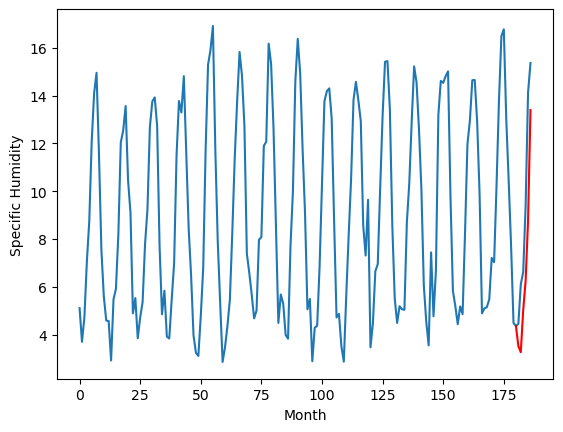

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		4.97		-0.05
4.46		4.70		0.24
6.97		6.60		-0.37
8.14		7.88		-0.26
11.66		10.50		-1.16
16.19		15.14		-1.05
[180, 181, 182, 183, 184, 185, 186]
[3.43, 4.965678841471672, 4.701531649231911, 6.597201824784279, 7.8754429823160175, 10.502911329865455, 15.13978552877903]


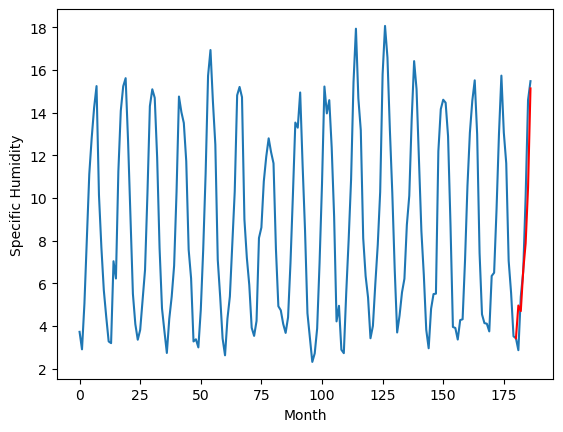

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		3.52		-0.65
4.11		3.14		-0.97
4.19		4.86		0.67
4.81		6.00		1.19
5.21		8.51		3.30
7.66		12.94		5.28
[180, 181, 182, 183, 184, 185, 186]
[5.43, 3.515741940140724, 3.1388920205831528, 4.859177317023278, 6.004605140089989, 8.51085957467556, 12.935628022551537]


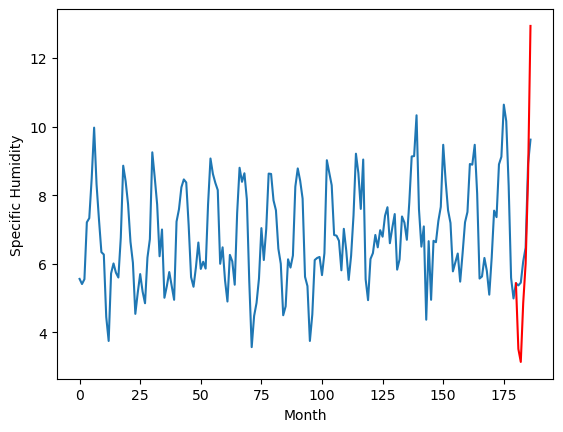

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.38		0.09
5.22		5.10		-0.12
6.52		6.91		0.39
7.71		8.15		0.44
10.24		10.70		0.46
15.66		15.33		-0.33
[180, 181, 182, 183, 184, 185, 186]
[3.21, 5.379783970713615, 5.104794753193855, 6.913802159428596, 8.150828135609625, 10.697209132313727, 15.32690788567066]


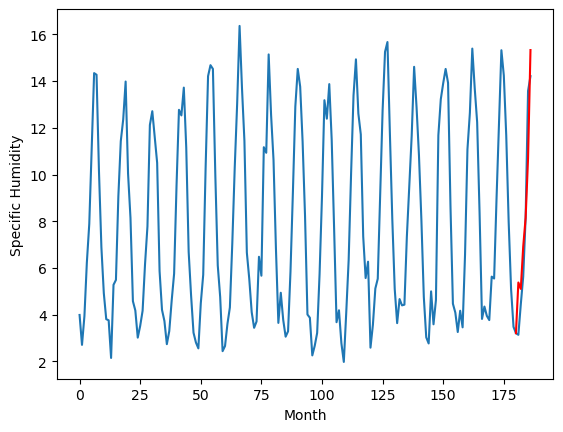

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		3.83		0.04
2.96		3.54		0.58
5.44		5.42		-0.02
6.50		6.69		0.19
8.92		9.28		0.36
13.38		13.93		0.55
[180, 181, 182, 183, 184, 185, 186]
[3.04, 3.83058777987957, 3.541290586590767, 5.422252123951912, 6.693555658459664, 9.284026926159859, 13.926558797955513]


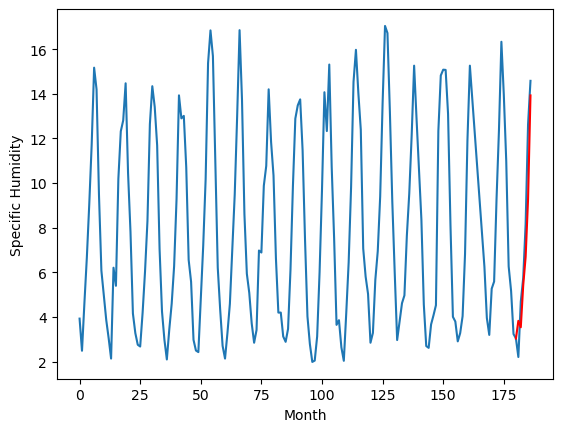

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		3.78		0.16
3.10		3.51		0.41
5.13		5.39		0.26
6.43		6.69		0.26
8.67		9.29		0.62
13.89		14.00		0.11
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.777067192196846, 3.508284278512001, 5.3912276703119275, 6.694187589287758, 9.294549174904823, 13.997418113350868]


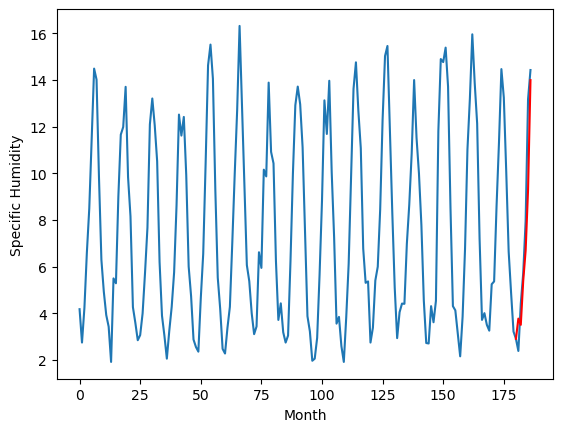

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.99		-0.36
4.41		3.68		-0.73
4.72		5.45		0.73
5.19		6.67		1.48
6.59		9.21		2.62
7.92		13.74		5.82
[180, 181, 182, 183, 184, 185, 186]
[1.6, 3.9913965988159177, 3.6783899295330045, 5.453420542478561, 6.670630358457565, 9.211176775693893, 13.739471815824508]


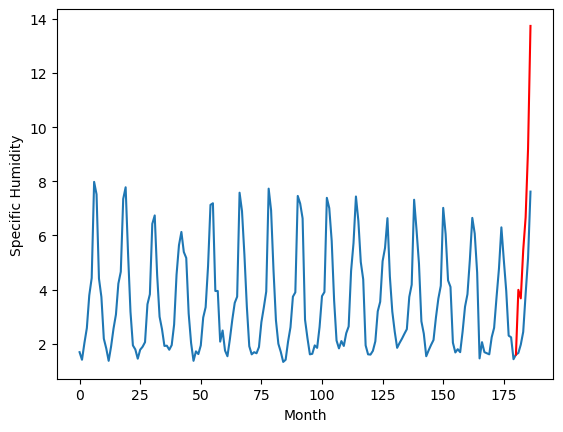

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		1.46		-1.04
2.02		1.09		-0.93
2.32		2.79		0.47
2.01		3.91		1.90
2.57		6.39		3.82
3.99		10.78		6.79
[180, 181, 182, 183, 184, 185, 186]
[2.86, 1.4632462137937545, 1.0894619697332382, 2.788350390791893, 3.914873647093773, 6.3906617635488505, 10.783547448515892]


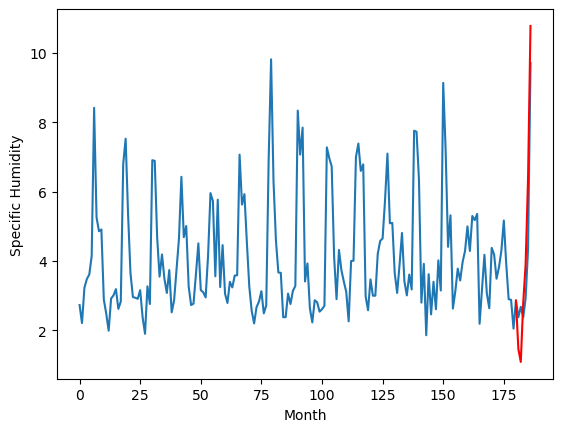

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		2.49		-0.91
3.05		2.09		-0.96
2.70		3.76		1.06
3.63		4.85		1.22
4.07		7.31		3.24
5.50		11.64		6.14
[180, 181, 182, 183, 184, 185, 186]
[5.65, 2.4875204521417618, 2.087527568936348, 3.7586904126405716, 4.848894293904305, 7.310777123570443, 11.638842042088509]


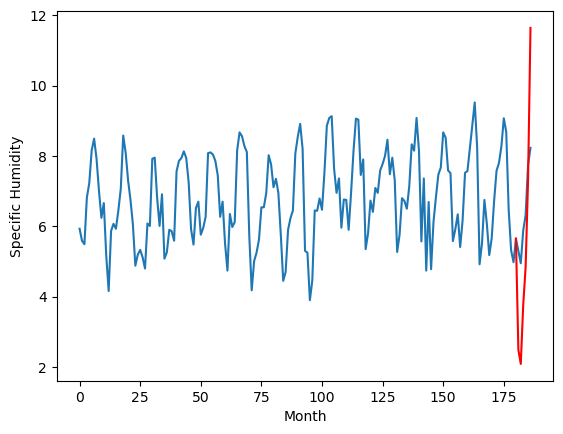

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.69		0.85
4.99		5.33		0.34
5.77		6.99		1.22
7.15		8.16		1.01
8.72		10.56		1.84
13.62		15.04		1.42
[180, 181, 182, 183, 184, 185, 186]
[2.54, 5.690381653904915, 5.333155580163002, 6.989449210762977, 8.15948457300663, 10.55655021250248, 15.041321464180946]


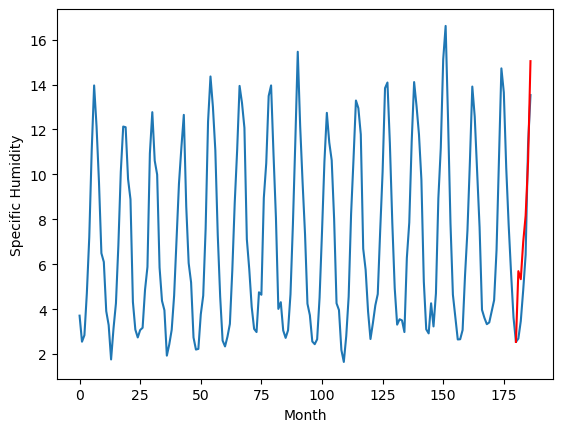

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		3.47		0.45
2.88		3.15		0.27
4.16		4.79		0.63
5.57		6.00		0.43
7.16		8.37		1.21
12.03		12.94		0.91
[180, 181, 182, 183, 184, 185, 186]
[2.51, 3.4713199204206466, 3.1454545027017593, 4.794959402680397, 5.9983074432611465, 8.36770746767521, 12.937678075432778]


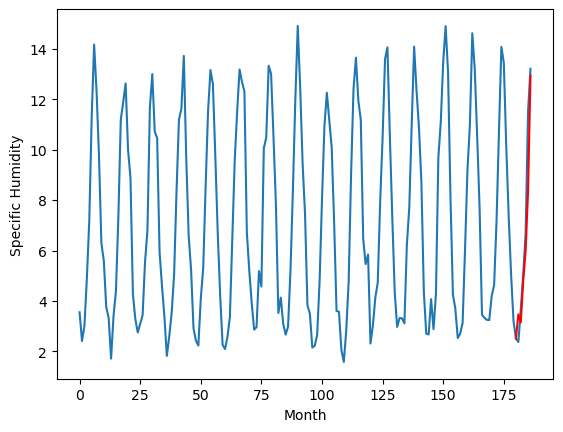

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   3.519207
1                 1    5.02   4.965679
2                 2    4.17   3.515742
3                 3    5.29   5.379784
4                 4    3.79   3.830588
5                 5    3.62   3.777067
6                 6    4.35   3.991397
7                 7    2.50   1.463246
8                 8    3.40   2.487520
9                 9    4.84   5.690382
10               10    3.02   3.471320


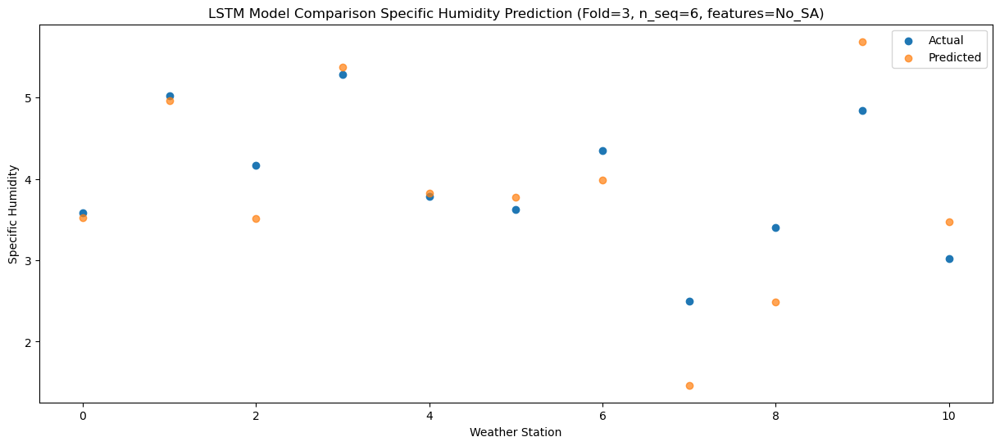

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.267200
1                 1    4.46   4.701532
2                 2    4.11   3.138892
3                 3    5.22   5.104795
4                 4    2.96   3.541291
5                 5    3.10   3.508284
6                 6    4.41   3.678390
7                 7    2.02   1.089462
8                 8    3.05   2.087528
9                 9    4.99   5.333156
10               10    2.88   3.145455


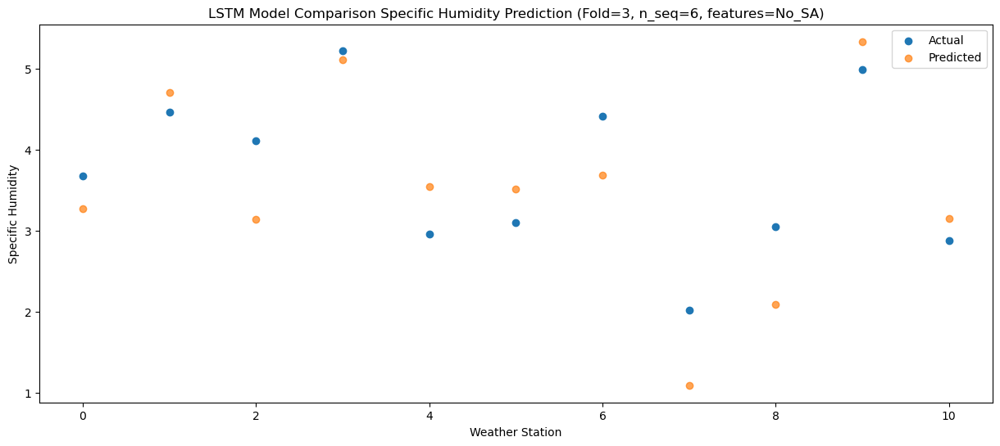

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   5.030328
1                 1    6.97   6.597202
2                 2    4.19   4.859177
3                 3    6.52   6.913802
4                 4    5.44   5.422252
5                 5    5.13   5.391228
6                 6    4.72   5.453421
7                 7    2.32   2.788350
8                 8    2.70   3.758690
9                 9    5.77   6.989449
10               10    4.16   4.794959


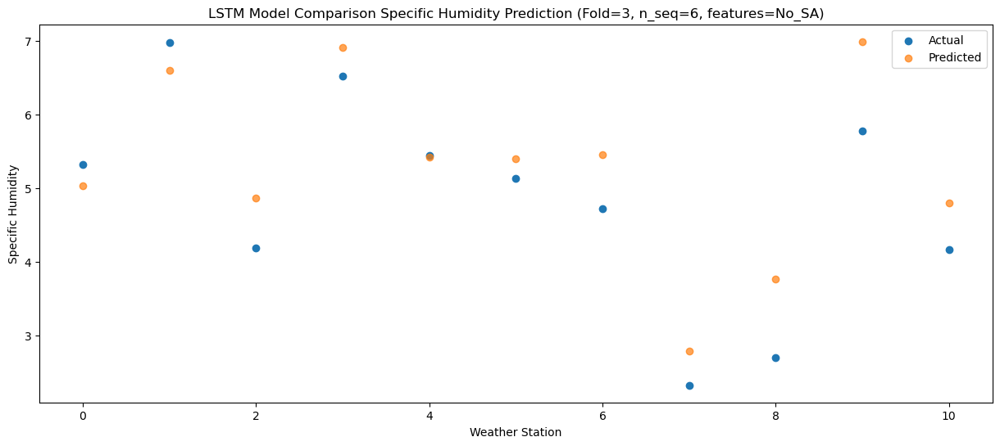

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    5.84   6.256440
1                 1    8.14   7.875443
2                 2    4.81   6.004605
3                 3    7.71   8.150828
4                 4    6.50   6.693556
5                 5    6.43   6.694188
6                 6    5.19   6.670630
7                 7    2.01   3.914874
8                 8    3.63   4.848894
9                 9    7.15   8.159485
10               10    5.57   5.998307


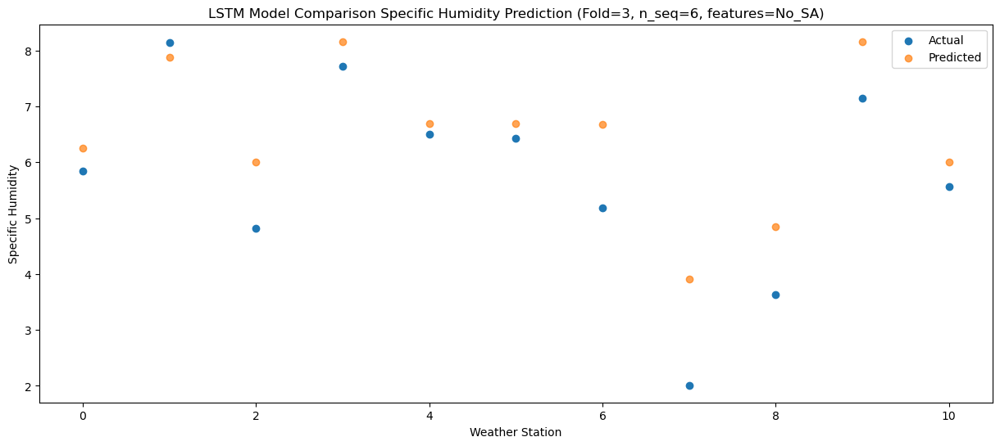

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    8.62   8.767110
1                 1   11.66  10.502911
2                 2    5.21   8.510860
3                 3   10.24  10.697209
4                 4    8.92   9.284027
5                 5    8.67   9.294549
6                 6    6.59   9.211177
7                 7    2.57   6.390662
8                 8    4.07   7.310777
9                 9    8.72  10.556550
10               10    7.16   8.367707


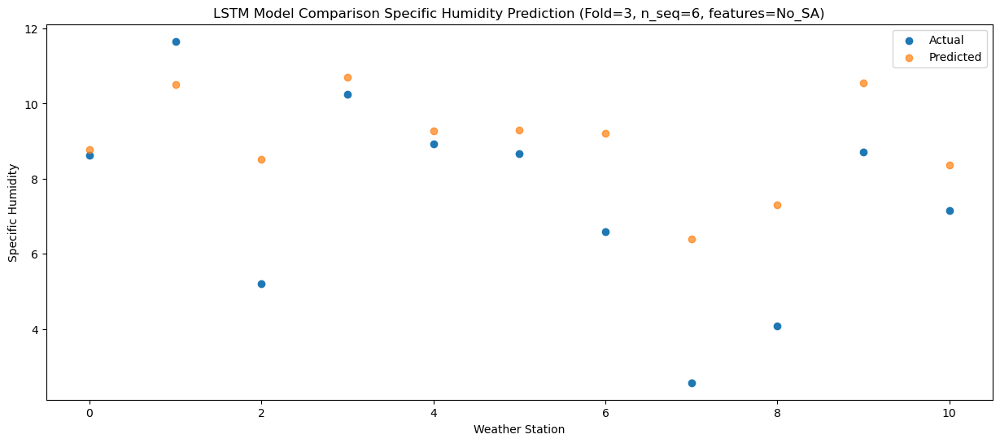

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   13.34  13.393983
1                 1   16.19  15.139786
2                 2    7.66  12.935628
3                 3   15.66  15.326908
4                 4   13.38  13.926559
5                 5   13.89  13.997418
6                 6    7.92  13.739472
7                 7    3.99  10.783547
8                 8    5.50  11.638842
9                 9   13.62  15.041321
10               10   12.03  12.937678


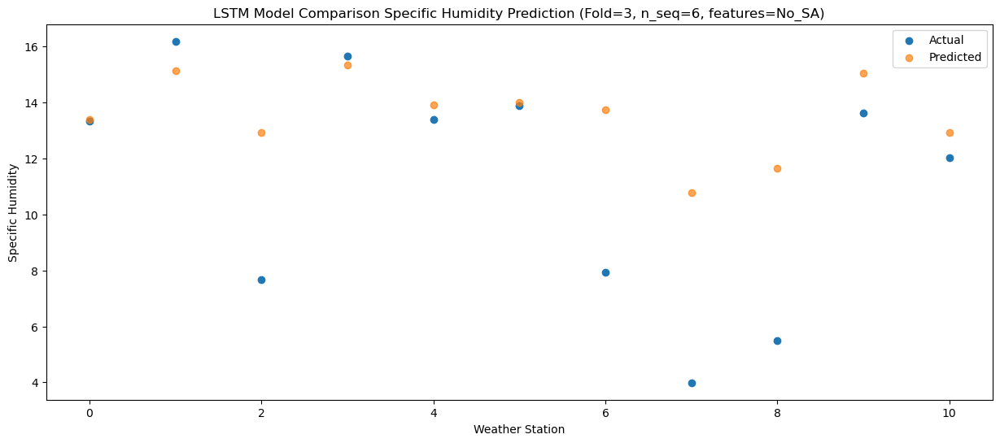

f, t:
[[ 3.58  5.02  4.17  5.29  3.79  3.62  4.35  2.5   3.4   4.84  3.02]
 [ 3.67  4.46  4.11  5.22  2.96  3.1   4.41  2.02  3.05  4.99  2.88]
 [ 5.32  6.97  4.19  6.52  5.44  5.13  4.72  2.32  2.7   5.77  4.16]
 [ 5.84  8.14  4.81  7.71  6.5   6.43  5.19  2.01  3.63  7.15  5.57]
 [ 8.62 11.66  5.21 10.24  8.92  8.67  6.59  2.57  4.07  8.72  7.16]
 [13.34 16.19  7.66 15.66 13.38 13.89  7.92  3.99  5.5  13.62 12.03]]
[[ 3.51920732  4.96567884  3.51574194  5.37978397  3.83058778  3.77706719
   3.9913966   1.46324621  2.48752045  5.69038165  3.47131992]
 [ 3.26720007  4.70153165  3.13889202  5.10479475  3.54129059  3.50828428
   3.67838993  1.08946197  2.08752757  5.33315558  3.1454545 ]
 [ 5.03032764  6.59720182  4.85917732  6.91380216  5.42225212  5.39122767
   5.45342054  2.78835039  3.75869041  6.98944921  4.7949594 ]
 [ 6.25643965  7.87544298  6.00460514  8.15082814  6.69355566  6.69418759
   6.67063036  3.91487365  4.84889429  8.15948457  5.99830744]
 [ 8.76710959 10.50291133  8.51

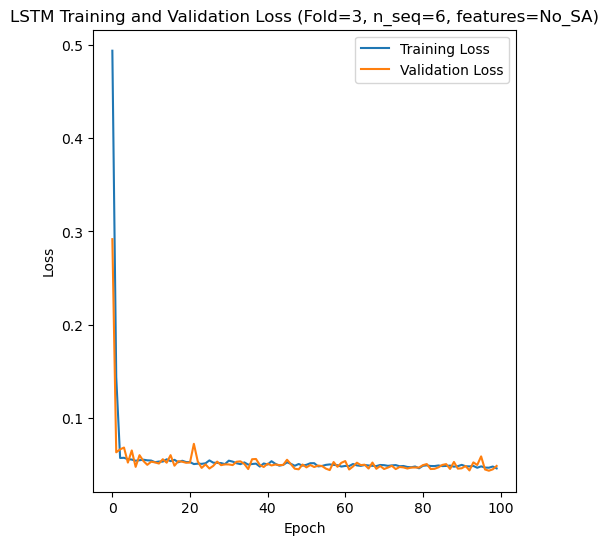

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 53s 305ms/step - loss: 0.4197 - accuracy: 0.0952 - mae: 0.4040 - rmse: 0.4197 - mape: 68.2107 - pearson: 0.0994 - val_loss: 0.1697 - val_accuracy: 0.0000e+00 - val_mae: 0.1492 - val_rmse: 0.1697 - val_mape: 25.2064 - val_pearson: 0.3476
Epoch 2/100
84/84 [==============================] - 16s 196ms/step - loss: 0.0793 - accuracy: 0.6667 - mae: 0.0667 - rmse: 0.0793 - mape: 11.2600 - pearson: 0.6793 - val_loss: 0.0551 - val_accuracy: 1.0000 - val_mae: 0.0463 - val_rmse: 0.0551 - val_mape: 8.3172 - val_pearson: 0.8234
Epoch 3/100
84/84 [==============================] - 16s 194ms/step - loss: 0.0602 - accuracy: 0.7738 - mae: 0.0497 - rmse: 0.0602 - mape: 8.4390 - pearson: 0.74

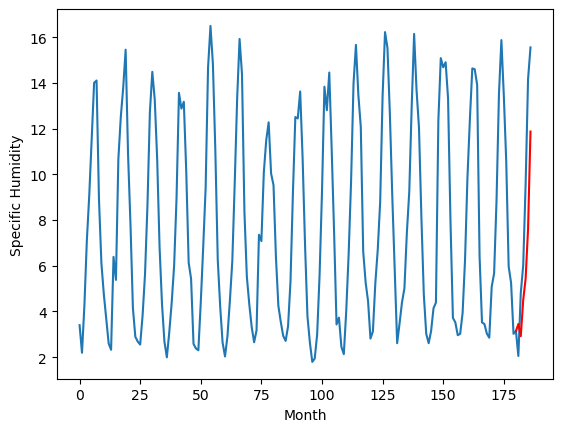

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.03		-0.72
5.74		2.58		-3.16
5.71		4.11		-1.60
6.46		5.05		-1.41
7.79		7.22		-0.57
12.08		11.52		-0.56
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.025633269548416, 2.5811879873275756, 4.112884068489075, 5.054364168643952, 7.216673576831818, 11.521090710163117]


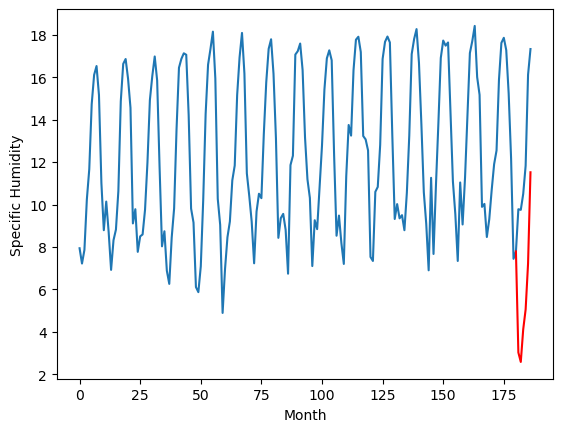

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.64		-0.19
7.71		7.25		-0.46
10.77		8.93		-1.84
11.02		9.90		-1.12
14.46		12.19		-2.27
18.70		16.59		-2.11
[180, 181, 182, 183, 184, 185, 186]
[5.03, 7.636656376123429, 7.251050266027451, 8.926518234014512, 9.90049788594246, 12.188036175966264, 16.58569213986397]


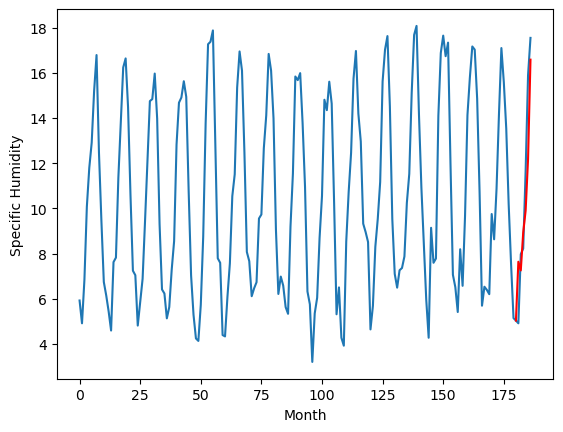

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.65		-0.16
5.49		5.26		-0.23
8.15		7.02		-1.13
9.44		8.02		-1.42
13.44		10.43		-3.01
17.13		14.85		-2.28
[180, 181, 182, 183, 184, 185, 186]
[4.41, 5.652095897197723, 5.255835784673691, 7.015156162977219, 8.022779000997543, 10.430068267583847, 14.84864927649498]


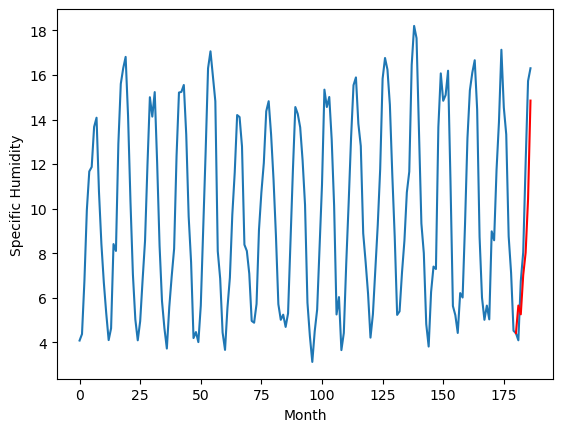

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		3.83		-0.21
3.59		3.41		-0.18
6.17		5.20		-0.97
7.53		6.21		-1.32
11.82		8.68		-3.14
15.70		13.09		-2.61
[180, 181, 182, 183, 184, 185, 186]
[4.29, 3.828157113790512, 3.4099156427383424, 5.1992015409469605, 6.212498502731323, 8.675421552658081, 13.087035970687866]


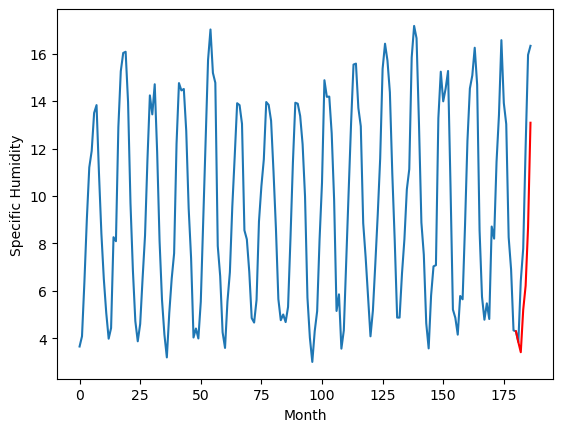

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.38		-0.97
3.71		2.91		-0.80
5.20		4.58		-0.62
6.16		5.54		-0.62
10.71		7.94		-2.77
13.01		12.22		-0.79
[180, 181, 182, 183, 184, 185, 186]
[3.47, 3.3802522361278533, 2.907732421159744, 4.579597169160843, 5.539420121908188, 7.938680404424668, 12.219716781377793]


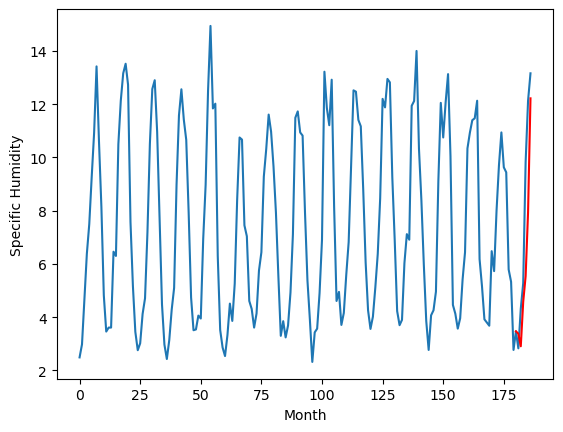

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.19		-0.18
2.62		1.84		-0.78
4.33		3.53		-0.80
4.74		4.57		-0.17
7.72		6.89		-0.83
12.41		11.37		-1.04
[180, 181, 182, 183, 184, 185, 186]
[4.52, 2.1945260071754458, 1.835136731863022, 3.5304876172542574, 4.566857894659043, 6.885952075719834, 11.37006004691124]


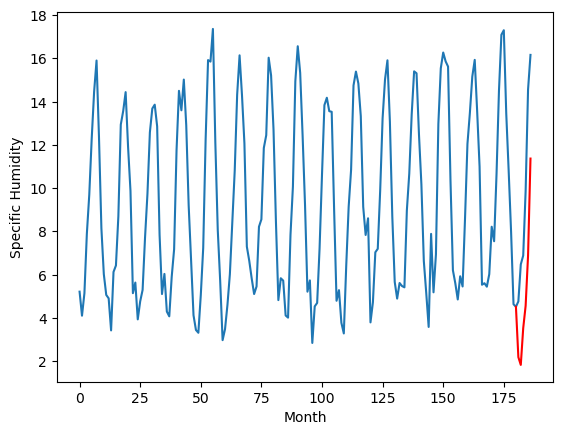

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.95		-0.12
4.44		4.59		0.15
6.81		6.37		-0.44
7.73		7.44		-0.29
10.89		9.83		-1.06
15.49		14.37		-1.12
[180, 181, 182, 183, 184, 185, 186]
[3.4, 4.953009487390518, 4.586168707609176, 6.37114077925682, 7.4372349393367765, 9.831695140600203, 14.36657911658287]


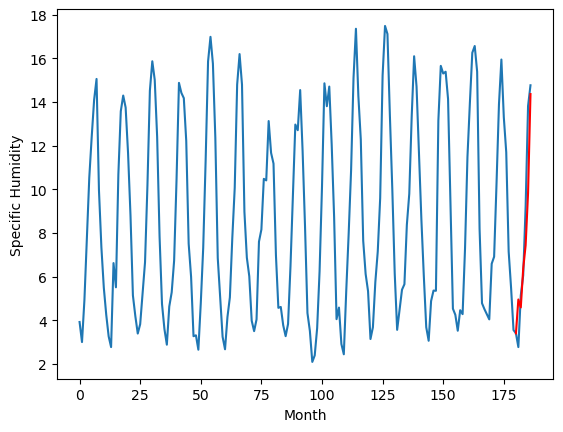

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.62		0.05
3.00		3.27		0.27
4.94		5.02		0.08
6.27		6.17		-0.10
8.56		8.46		-0.10
13.62		13.11		-0.51
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.6169386637210845, 3.26767746925354, 5.0153006744384765, 6.170283241271973, 8.46334568977356, 13.110131425857544]


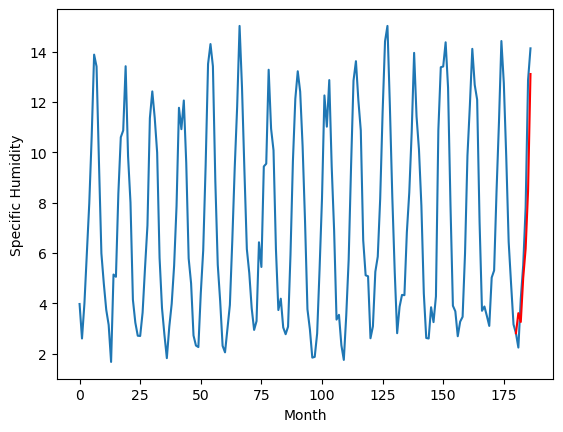

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.66		0.00
3.02		3.29		0.27
5.39		5.06		-0.33
6.70		6.23		-0.47
9.32		8.52		-0.80
14.07		13.19		-0.88
[180, 181, 182, 183, 184, 185, 186]
[2.86, 3.6616411912441253, 3.2928697276115417, 5.063935558795929, 6.227682988643647, 8.520634334087372, 13.193066756725312]


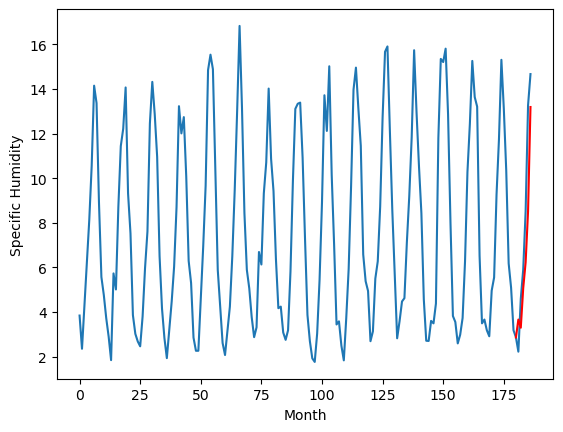

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.44		-0.02
2.89		3.10		0.21
4.18		4.76		0.58
5.85		5.97		0.12
7.45		8.09		0.64
12.46		12.80		0.34
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.4437635803222655, 3.0959317648410796, 4.759006496667862, 5.970997568368912, 8.094110485315323, 12.80318593621254]


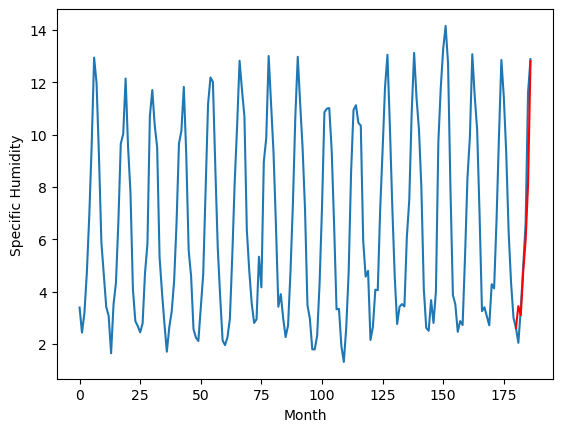

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.449593
1                 1    3.75   3.025633
2                 2    7.83   7.636656
3                 3    5.81   5.652096
4                 4    4.04   3.828157
5                 5    4.35   3.380252
6                 6    2.37   2.194526
7                 7    5.07   4.953009
8                 8    3.57   3.616939
9                 9    3.66   3.661641
10               10    3.46   3.443764


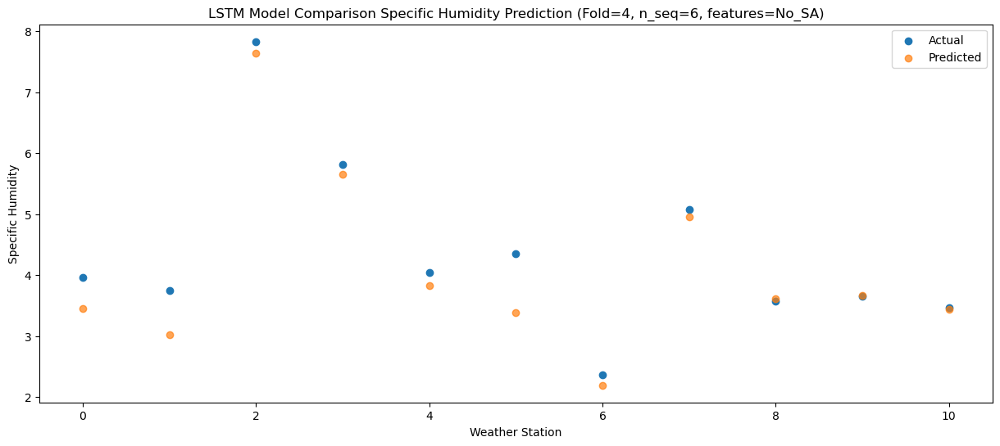

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   2.919462
1                 1    5.74   2.581188
2                 2    7.71   7.251050
3                 3    5.49   5.255836
4                 4    3.59   3.409916
5                 5    3.71   2.907732
6                 6    2.62   1.835137
7                 7    4.44   4.586169
8                 8    3.00   3.267677
9                 9    3.02   3.292870
10               10    2.89   3.095932


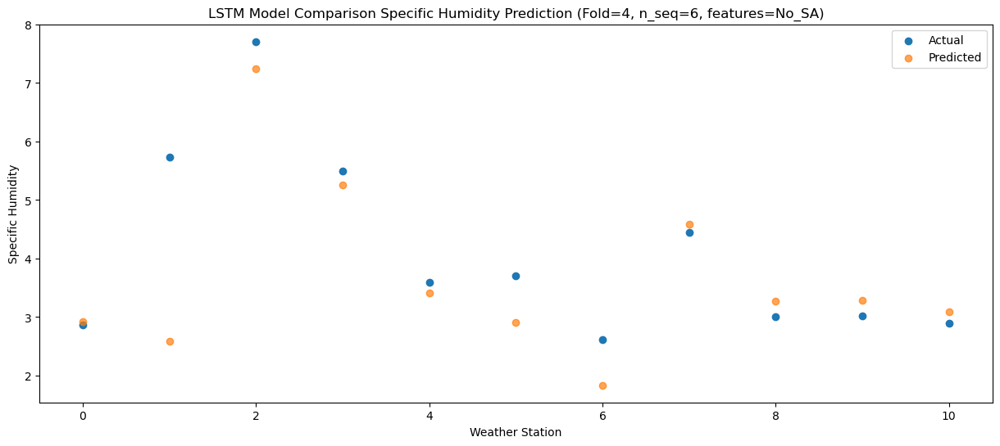

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   4.494959
1                 1    5.71   4.112884
2                 2   10.77   8.926518
3                 3    8.15   7.015156
4                 4    6.17   5.199202
5                 5    5.20   4.579597
6                 6    4.33   3.530488
7                 7    6.81   6.371141
8                 8    4.94   5.015301
9                 9    5.39   5.063936
10               10    4.18   4.759006


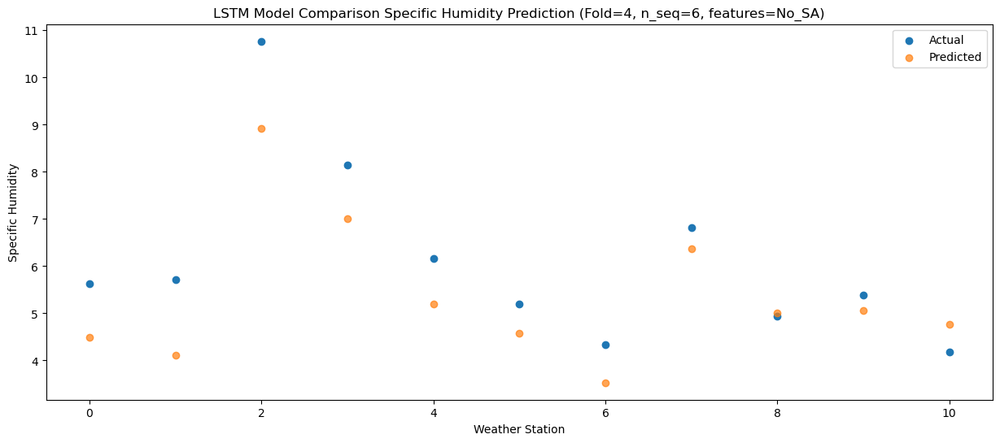

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.84   5.439353
1                 1    6.46   5.054364
2                 2   11.02   9.900498
3                 3    9.44   8.022779
4                 4    7.53   6.212499
5                 5    6.16   5.539420
6                 6    4.74   4.566858
7                 7    7.73   7.437235
8                 8    6.27   6.170283
9                 9    6.70   6.227683
10               10    5.85   5.970998


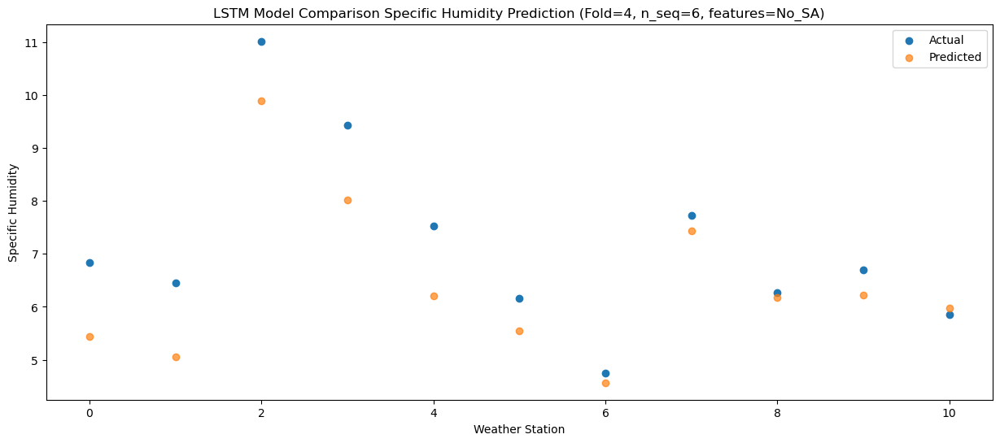

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.40   7.608517
1                 1    7.79   7.216674
2                 2   14.46  12.188036
3                 3   13.44  10.430068
4                 4   11.82   8.675422
5                 5   10.71   7.938680
6                 6    7.72   6.885952
7                 7   10.89   9.831695
8                 8    8.56   8.463346
9                 9    9.32   8.520634
10               10    7.45   8.094110


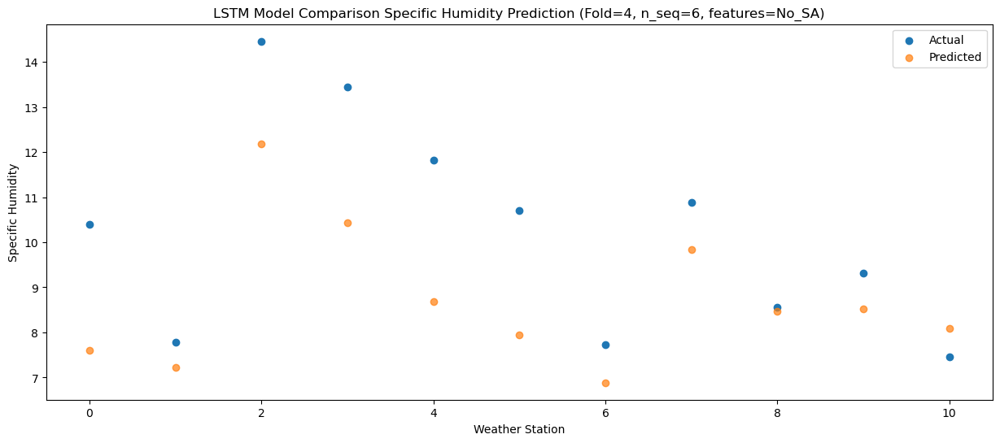

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.99  11.877306
1                 1   12.08  11.521091
2                 2   18.70  16.585692
3                 3   17.13  14.848649
4                 4   15.70  13.087036
5                 5   13.01  12.219717
6                 6   12.41  11.370060
7                 7   15.49  14.366579
8                 8   13.62  13.110131
9                 9   14.07  13.193067
10               10   12.46  12.803186


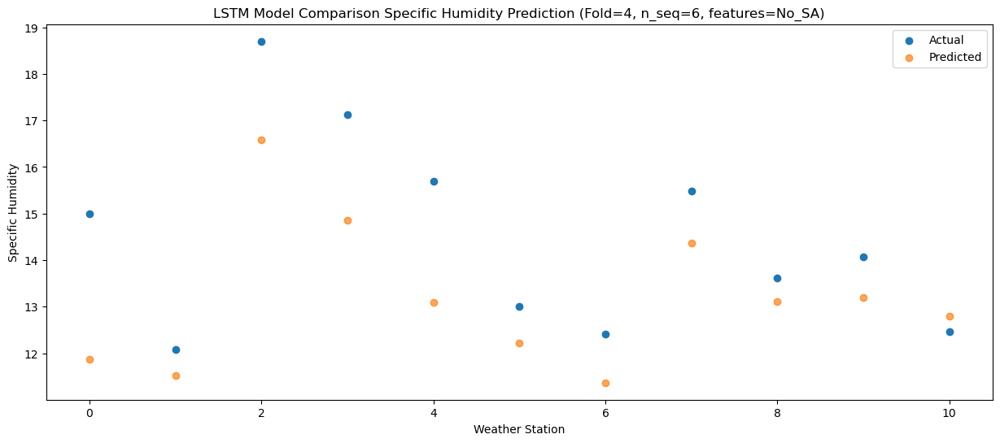

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]
 [ 6.84  6.46 11.02  9.44  7.53  6.16  4.74  7.73  6.27  6.7   5.85]
 [10.4   7.79 14.46 13.44 11.82 10.71  7.72 10.89  8.56  9.32  7.45]
 [14.99 12.08 18.7  17.13 15.7  13.01 12.41 15.49 13.62 14.07 12.46]]
[[ 3.4495933   3.02563327  7.63665638  5.6520959   3.82815711  3.38025224
   2.19452601  4.95300949  3.61693866  3.66164119  3.44376358]
 [ 2.9194616   2.58118799  7.25105027  5.25583578  3.40991564  2.90773242
   1.83513673  4.58616871  3.26767747  3.29286973  3.09593176]
 [ 4.49495887  4.11288407  8.92651823  7.01515616  5.19920154  4.57959717
   3.53048762  6.37114078  5.01530067  5.06393556  4.7590065 ]
 [ 5.43935287  5.05436417  9.90049789  8.022779    6.2124985   5.53942012
   4.56685789  7.43723494  6.17028324  6.22768299  5.97099757]
 [ 7.60851681  7.21667358 12.18

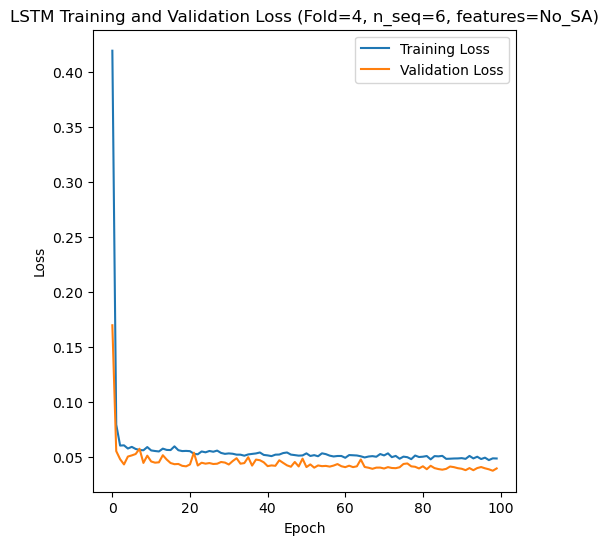

[[1.0803121492727314], [0.8135864387690525], [1.4983194942074953], [1.8359629932839179], [1.2783263587312526]]
[[array(1.08031215)], [array(0.81358644)], [array(1.49831949)], [array(1.83596299)], [array(1.27832636)]]
[[0.791514301598072], [0.6072100499345725], [1.0395178554094195], [1.1027413685213439], [0.9243263669628085]]
[[0.08596008567546977], [0.08884591400576014], [0.14608381617398783], [0.23470668868514602], [0.11507173950142131]]
[[0.9280814543540864], [0.9611163184089347], [0.8521746270448209], [0.7066137420738374], [0.9012225285969359]]
[[array(0.08596009)], [array(0.08884591)], [array(0.14608382)], [array(0.23470669)], [array(0.11507174)]]
[[array(0.96440529)], [array(0.96493754)], [array(0.8646046)], [array(0.7972017)], [array(0.95379464)]]
[ 3.9   3.41  6.58  6.97 10.12 14.93  5.74  6.45  8.66  8.88 11.37 16.12
  8.41  8.56 10.41 10.65 13.41 18.03  5.55  5.46  8.91  9.48 12.99 16.89
  7.36  6.96  9.8  11.2  15.21 18.9   4.02  4.61  6.18  7.19  9.69 14.95
  6.35  6.4   7.9

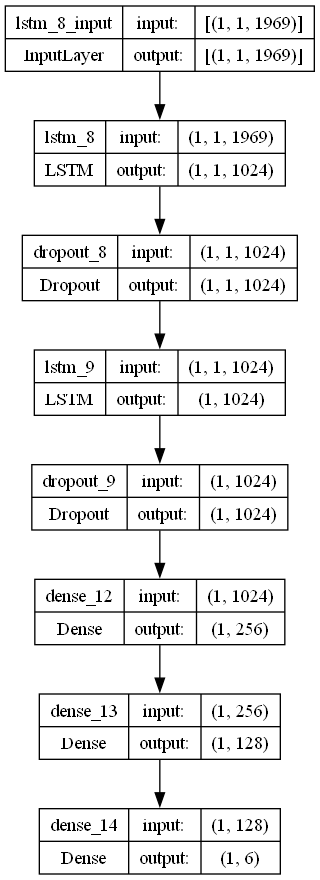

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.004007133869044381 
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.1748385256315801

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)